In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error,r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn import model_selection
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn import neighbors
from sklearn.svm import SVR
import warnings
warnings.filterwarnings("ignore")

In [6]:
df=pd.read_csv("/content/archive (11).zip")
df

,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
0,01/11/2011 00:00,NaN,0,1,44,1,11,2011,0,315.31,3388.77,49.26,6.00,9.30,600.71,356.00,3159.60,54.32
1,01/11/2011 00:30,NaN,0,1,44,1,11,2011,1,321.80,3196.66,49.26,6.00,11.10,605.42,317.00,2973.01,54.23
2,01/11/2011 01:00,NaN,0,1,44,1,11,2011,2,328.57,3060.71,49.10,5.00,11.10,589.97,311.00,2834.00,54.23
3,01/11/2011 01:30,NaN,0,1,44,1,11,2011,3,335.60,2945.56,48.04,6.00,9.30,585.94,313.00,2725.99,53.47
4,01/11/2011 02:00,NaN,0,1,44,1,11,2011,4,342.90,2849.34,33.75,6.00,11.10,571.52,346.00,2655.64,39.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,31/12/2013 21:30,New Year's Eve,1,1,1,31,12,2013,43,1179.14,3932.22,34.51,6.00,22.20,285.31,812.0,3692.95,42.45
38010,31/12/2013 22:00,New Year's Eve,1,1,1,31,12,2013,44,1152.01,3821.44,33.83,5.00,24.10,278.31,852.0,3571.0,33.83
38011,31/12/2013 22:30,New Year's Eve,1,1,1,31,12,2013,45,1123.67,3724.21,31.75,4.00,20.40,280.91,962.0,3460.29,31.75
38012,31/12/2013 23:00,New Year's Eve,1,1,1,31,12,2013,46,1094.24,3638.16,33.83,5.00,14.80,302.46,950.0,3563.99,50.6


In [7]:
df.head( 100)

,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
0,01/11/2011 00:00,NaN,0,1,44,1,11,2011,0,315.31,3388.77,49.26,6.00,9.30,600.71,356.00,3159.60,54.32
1,01/11/2011 00:30,NaN,0,1,44,1,11,2011,1,321.80,3196.66,49.26,6.00,11.10,605.42,317.00,2973.01,54.23
2,01/11/2011 01:00,NaN,0,1,44,1,11,2011,2,328.57,3060.71,49.10,5.00,11.10,589.97,311.00,2834.00,54.23
3,01/11/2011 01:30,NaN,0,1,44,1,11,2011,3,335.60,2945.56,48.04,6.00,9.30,585.94,313.00,2725.99,53.47
4,01/11/2011 02:00,NaN,0,1,44,1,11,2011,4,342.90,2849.34,33.75,6.00,11.10,571.52,346.00,2655.64,39.87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,02/11/2011 23:30,NaN,0,2,44,2,11,2011,47,1245.68,3957.31,54.65,12.00,33.30,385.27,1270.00,3465.06,48.36
96,03/11/2011 00:00,NaN,0,3,44,3,11,2011,0,1214.47,3645.55,54.21,12.00,35.20,373.89,1252.00,3235.88,47.38
97,03/11/2011 00:30,NaN,0,3,44,3,11,2011,1,1178.77,3418.87,51.89,12.00,29.60,320.85,1258.00,3058.27,45.39
98,03/11/2011 01:00,NaN,0,3,44,3,11,2011,2,1140.00,3251.74,51.89,12.00,29.60,321.07,1213.00,2922.82,32.54


In [8]:
df.tail(100)

,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
37914,29/12/2013 22:00,NaN,0,6,52,29,12,2013,44,1389.25,4019.23,34.9,10.00,48.20,308.38,966.0,3711.89,68.34
37915,29/12/2013 22:30,NaN,0,6,52,29,12,2013,45,1310.91,3845.02,36.52,10.00,48.20,312.07,863.0,3603.82,84.43
37916,29/12/2013 23:00,NaN,0,6,52,29,12,2013,46,1200.56,3751.48,44.08,10.00,46.30,320.59,763.0,3623.01,93.33
37917,29/12/2013 23:30,NaN,0,6,52,29,12,2013,47,1064.97,3746.55,44.08,10.00,46.30,315.93,677.0,3533.96,93.33
37918,30/12/2013 00:00,NaN,0,0,1,30,12,2013,0,704.33,3562.02,36.52,10.00,46.30,329.79,661.0,3360.82,93.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,31/12/2013 21:30,New Year's Eve,1,1,1,31,12,2013,43,1179.14,3932.22,34.51,6.00,22.20,285.31,812.0,3692.95,42.45
38010,31/12/2013 22:00,New Year's Eve,1,1,1,31,12,2013,44,1152.01,3821.44,33.83,5.00,24.10,278.31,852.0,3571.0,33.83
38011,31/12/2013 22:30,New Year's Eve,1,1,1,31,12,2013,45,1123.67,3724.21,31.75,4.00,20.40,280.91,962.0,3460.29,31.75
38012,31/12/2013 23:00,New Year's Eve,1,1,1,31,12,2013,46,1094.24,3638.16,33.83,5.00,14.80,302.46,950.0,3563.99,50.6


In [9]:
df.info()
print(df.info())
print(df.dtypes)
print(df.shape)
print(df.columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38014 entries, 0 to 38013
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   DateTime                38014 non-null  object
 1   Holiday                 1536 non-null   object
 2   HolidayFlag             38014 non-null  int64 
 3   DayOfWeek               38014 non-null  int64 
 4   WeekOfYear              38014 non-null  int64 
 5   Day                     38014 non-null  int64 
 6   Month                   38014 non-null  int64 
 7   Year                    38014 non-null  int64 
 8   PeriodOfDay             38014 non-null  int64 
 9   ForecastWindProduction  38014 non-null  object
 10  SystemLoadEA            38014 non-null  object
 11  SMPEA                   38014 non-null  object
 12  ORKTemperature          38014 non-null  object
 13  ORKWindspeed            38014 non-null  object
 14  CO2Intensity            38014 non-null  object
 15  Ac

In [10]:
print(df.isnull().sum())

DateTime                      0
Holiday                   36478
HolidayFlag                   0
DayOfWeek                     0
WeekOfYear                    0
Day                           0
Month                         0
Year                          0
PeriodOfDay                   0
ForecastWindProduction        0
SystemLoadEA                  0
SMPEA                         0
ORKTemperature                0
ORKWindspeed                  0
CO2Intensity                  0
ActualWindProduction          0
SystemLoadEP2                 0
SMPEP2                        0
dtype: int64


In [11]:
df.corr(numeric_only=True)

,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay
HolidayFlag,1.000000,-0.124773,-0.003286,0.046133,0.032414,-0.023431,-0.000016
DayOfWeek,-0.124773,1.000000,0.007504,-0.004423,0.003056,-0.001196,0.000120
WeekOfYear,-0.003286,0.007504,1.000000,0.060816,0.971182,-0.237323,-0.000083
Day,0.046133,-0.004423,0.060816,1.000000,0.008698,-0.001786,0.000084
Month,0.032414,0.003056,0.971182,0.008698,1.000000,-0.236833,-0.000087
Year,-0.023431,-0.001196,-0.237323,-0.001786,-0.236833,1.000000,-0.000049
PeriodOfDay,-0.000016,0.000120,-0.000083,0.000084,-0.000087,-0.000049,1.000000


In [12]:
df.shape

(38014, 18)

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
HolidayFlag,38014.0,0.040406,0.196912,0.0,0.0,0.0,0.00,1.0
DayOfWeek,38014.0,2.997317,1.999959,0.0,1.0,3.0,5.00,6.0
WeekOfYear,38014.0,28.124586,15.587575,1.0,15.0,29.0,43.00,52.0
Day,38014.0,15.739412,8.804247,1.0,8.0,16.0,23.00,31.0
Month,38014.0,6.904246,3.573696,1.0,4.0,7.0,10.00,12.0
Year,38014.0,2012.383859,0.624956,2011.0,2012.0,2012.0,2013.00,2013.0
PeriodOfDay,38014.0,23.501105,13.853108,0.0,12.0,24.0,35.75,47.0


In [14]:
df.describe([0.1,0.25,0.5,0.65,0.75,0.9,0.95]).T


,count,mean,std,min,10%,25%,50%,65%,75%,90%,95%,max
HolidayFlag,38014.0,0.040406,0.196912,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,1.0
DayOfWeek,38014.0,2.997317,1.999959,0.0,0.0,1.0,3.0,4.0,5.00,6.0,6.0,6.0
WeekOfYear,38014.0,28.124586,15.587575,1.0,6.0,15.0,29.0,37.0,43.00,49.0,51.0,52.0
Day,38014.0,15.739412,8.804247,1.0,4.0,8.0,16.0,20.0,23.00,28.0,29.0,31.0
Month,38014.0,6.904246,3.573696,1.0,2.0,4.0,7.0,9.0,10.00,12.0,12.0,12.0
Year,38014.0,2012.383859,0.624956,2011.0,2012.0,2012.0,2012.0,2013.0,2013.00,2013.0,2013.0,2013.0
PeriodOfDay,38014.0,23.501105,13.853108,0.0,4.0,12.0,24.0,31.0,35.75,43.0,45.0,47.0


In [15]:
df.nunique()


,0
DateTime,38014
Holiday,14
HolidayFlag,2
DayOfWeek,7
WeekOfYear,52
Day,31
Month,12
Year,3
PeriodOfDay,48
ForecastWindProduction,29312


In [16]:
col=df.columns
for i in col:
  print(i)
  print(df[i].value_counts())

DateTime
DateTime
01/11/2011 00:00    1
11/04/2013 21:30    1
11/04/2013 22:30    1
11/04/2013 23:00    1
11/04/2013 23:30    1
                   ..
22/07/2012 00:30    1
22/07/2012 01:00    1
22/07/2012 01:30    1
22/07/2012 02:00    1
31/12/2013 23:30    1
Name: count, Length: 38014, dtype: int64
Holiday
Holiday
Christmas Eve           144
Christmas               144
St Stephen's Day        144
New Year's Eve          144
New Year's Day           96
St Patrick's Day         96
Good Friday              96
Holy Saturday            96
Easter                   96
Easter Monday            96
May Day                  96
June Bank Holiday        96
August Bank Holiday      96
October Bank Holiday     96
Name: count, dtype: int64
HolidayFlag
HolidayFlag
0    36478
1     1536
Name: count, dtype: int64
DayOfWeek
DayOfWeek
1    5472
2    5424
3    5424
4    5424
5    5424
0    5424
6    5422
Name: count, dtype: int64
WeekOfYear
WeekOfYear
45    1008
46    1008
47    1008
48    1008
49    1008


In [17]:
col=df.columns
for i in col:
  print(i)
  print(df[i].unique())

DateTime
['01/11/2011 00:00' '01/11/2011 00:30' '01/11/2011 01:00' ...
 '31/12/2013 22:30' '31/12/2013 23:00' '31/12/2013 23:30']
Holiday
[nan 'Christmas Eve' 'Christmas' "St Stephen's Day" "New Year's Eve"
 "New Year's Day" "St Patrick's Day" 'Good Friday' 'Holy Saturday'
 'Easter' 'Easter Monday' 'May Day' 'June Bank Holiday'
 'August Bank Holiday' 'October Bank Holiday']
HolidayFlag
[0 1]
DayOfWeek
[1 2 3 4 5 6 0]
WeekOfYear
[44 45 46 47 48 49 50 51 52  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15
 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39
 40 41 42 43]
Day
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]
Month
[11 12  1  2  3  4  5  6  7  8  9 10]
Year
[2011 2012 2013]
PeriodOfDay
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
ForecastWindProduction
['315.31' '321.80' '328.57' ... 1123.67 1094.24 1064.0]
Syst

In [18]:
col=df.columns
for i in col:
  print(i)
  print(df[i].nunique())

DateTime
38014
Holiday
14
HolidayFlag
2
DayOfWeek
7
WeekOfYear
52
Day
31
Month
12
Year
3
PeriodOfDay
48
ForecastWindProduction
29312
SystemLoadEA
36166
SMPEA
8661
ORKTemperature
32
ORKWindspeed
53
CO2Intensity
25115
ActualWindProduction
2940
SystemLoadEP2
36171
SMPEP2
9277


In [19]:
col=["Holiday","HolidayFlag","DayOfWeek","WeekOfYear","Day","Month",
    "Year","PeriodOfDay","ORKTemperature"]
for i in col:
  print(i)
  print(df[i].value_counts())
  print("*"*30)


Holiday
Holiday
Christmas Eve           144
Christmas               144
St Stephen's Day        144
New Year's Eve          144
New Year's Day           96
St Patrick's Day         96
Good Friday              96
Holy Saturday            96
Easter                   96
Easter Monday            96
May Day                  96
June Bank Holiday        96
August Bank Holiday      96
October Bank Holiday     96
Name: count, dtype: int64
******************************
HolidayFlag
HolidayFlag
0    36478
1     1536
Name: count, dtype: int64
******************************
DayOfWeek
DayOfWeek
1    5472
2    5424
3    5424
4    5424
5    5424
0    5424
6    5422
Name: count, dtype: int64
******************************
WeekOfYear
WeekOfYear
45    1008
46    1008
47    1008
48    1008
49    1008
50    1008
51    1008
52    1008
44     960
1      768
25     672
26     672
33     672
27     672
28     672
29     672
30     672
31     672
32     672
37     672
34     672
35     672
36     672
23     672

In [20]:
#Get the Percentage of Each Unique Value\
col=["Holiday","HolidayFlag","DayOfWeek","WeekOfYear","Day","Month",
    "Year","PeriodOfDay","ORKTemperature"]
for i in col:
  print(i)
  print(df[i].value_counts(normalize=True))

Holiday
Holiday
Christmas Eve           0.09375
Christmas               0.09375
St Stephen's Day        0.09375
New Year's Eve          0.09375
New Year's Day          0.06250
St Patrick's Day        0.06250
Good Friday             0.06250
Holy Saturday           0.06250
Easter                  0.06250
Easter Monday           0.06250
May Day                 0.06250
June Bank Holiday       0.06250
August Bank Holiday     0.06250
October Bank Holiday    0.06250
Name: proportion, dtype: float64
HolidayFlag
HolidayFlag
0    0.959594
1    0.040406
Name: proportion, dtype: float64
DayOfWeek
DayOfWeek
1    0.143947
2    0.142684
3    0.142684
4    0.142684
5    0.142684
0    0.142684
6    0.142632
Name: proportion, dtype: float64
WeekOfYear
WeekOfYear
45    0.026517
46    0.026517
47    0.026517
48    0.026517
49    0.026517
50    0.026517
51    0.026517
52    0.026517
44    0.025254
1     0.020203
25    0.017678
26    0.017678
33    0.017678
27    0.017678
28    0.017678
29    0.017678
30   

In [21]:
#Sort by Value Instead of Count
col=["Holiday","HolidayFlag","DayOfWeek","WeekOfYear","Day","Month",
    "Year","PeriodOfDay","ORKTemperature"]
for i in col:
  print(i)
  print(df[i].value_counts(ascending=True))
  print("*"*30)

Holiday
Holiday
New Year's Day           96
St Patrick's Day         96
Good Friday              96
Holy Saturday            96
Easter                   96
Easter Monday            96
May Day                  96
June Bank Holiday        96
August Bank Holiday      96
October Bank Holiday     96
Christmas Eve           144
Christmas               144
St Stephen's Day        144
New Year's Eve          144
Name: count, dtype: int64
******************************
HolidayFlag
HolidayFlag
1     1536
0    36478
Name: count, dtype: int64
******************************
DayOfWeek
DayOfWeek
6    5422
2    5424
3    5424
4    5424
5    5424
0    5424
1    5472
Name: count, dtype: int64
******************************
WeekOfYear
WeekOfYear
12     670
17     672
20     672
21     672
22     672
23     672
24     672
25     672
26     672
27     672
28     672
29     672
30     672
31     672
32     672
33     672
34     672
35     672
36     672
37     672
38     672
39     672
40     672
41     672

In [22]:
#Limit the Number of Values to Display
col=["Holiday","HolidayFlag","DayOfWeek","WeekOfYear","Day","Month",
    "Year","PeriodOfDay","ORKTemperature"]
for i in col:
  print(i)
  print(df[i].value_counts(ascending=True,dropna=False))
  print("*"*30)

Holiday
Holiday
New Year's Day             96
St Patrick's Day           96
Good Friday                96
Holy Saturday              96
Easter                     96
Easter Monday              96
May Day                    96
June Bank Holiday          96
August Bank Holiday        96
October Bank Holiday       96
Christmas Eve             144
Christmas                 144
St Stephen's Day          144
New Year's Eve            144
NaN                     36478
Name: count, dtype: int64
******************************
HolidayFlag
HolidayFlag
1     1536
0    36478
Name: count, dtype: int64
******************************
DayOfWeek
DayOfWeek
6    5422
2    5424
3    5424
4    5424
5    5424
0    5424
1    5472
Name: count, dtype: int64
******************************
WeekOfYear
WeekOfYear
12     670
17     672
20     672
21     672
22     672
23     672
24     672
25     672
26     672
27     672
28     672
29     672
30     672
31     672
32     672
33     672
34     672
35     672
36     

In [23]:
#Bin Continuous Data
df["ORKTemperature"] = pd.to_numeric(df["ORKTemperature"], errors='coerce')
df["ORKTemperature"]
df["ForecastWindProduction"]=pd.to_numeric(df["ForecastWindProduction"], errors= 'coerce')
df["SystemLoadEA"] = pd.to_numeric(df["SystemLoadEA"], errors= 'coerce')
df["SMPEA"] = pd.to_numeric(df["SMPEA"], errors= 'coerce')
df["ORKTemperature"] = pd.to_numeric(df["ORKTemperature"], errors= 'coerce')
df["ORKWindspeed"] = pd.to_numeric(df["ORKWindspeed"], errors= 'coerce')
df["CO2Intensity"] = pd.to_numeric(df["CO2Intensity"], errors= 'coerce')
df["ActualWindProduction"] = pd.to_numeric(df["ActualWindProduction"], errors= 'coerce')
df["SystemLoadEP2"] = pd.to_numeric(df["SystemLoadEP2"], errors= 'coerce')
df["SMPEP2"] = pd.to_numeric(df["SMPEP2"], errors= 'coerce')
print(df["ORKTemperature"])
print(df["ForecastWindProduction"])
print(df["SystemLoadEA"])
print(df["SMPEA"])
print(df["ORKTemperature"])
print(df["ORKWindspeed"])
print(df["CO2Intensity"])
print(df["ActualWindProduction"])
print(df["SystemLoadEP2"])
print(df["SMPEP2"])


0        6.0
1        6.0
2        5.0
3        6.0
4        6.0
        ... 
38009    6.0
38010    5.0
38011    4.0
38012    5.0
38013    5.0
Name: ORKTemperature, Length: 38014, dtype: float64
0         315.31
1         321.80
2         328.57
3         335.60
4         342.90
          ...   
38009    1179.14
38010    1152.01
38011    1123.67
38012    1094.24
38013    1064.00
Name: ForecastWindProduction, Length: 38014, dtype: float64
0        3388.77
1        3196.66
2        3060.71
3        2945.56
4        2849.34
          ...   
38009    3932.22
38010    3821.44
38011    3724.21
38012    3638.16
38013    3624.25
Name: SystemLoadEA, Length: 38014, dtype: float64
0        49.26
1        49.26
2        49.10
3        48.04
4        33.75
         ...  
38009    34.51
38010    33.83
38011    31.75
38012    33.83
38013    33.83
Name: SMPEA, Length: 38014, dtype: float64
0        6.0
1        6.0
2        5.0
3        6.0
4        6.0
        ... 
38009    6.0
38010    5.0
38011    

In [24]:
#Drop Missing Values
df=df.dropna()
df

,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
2544,24/12/2011 00:00,Christmas Eve,1,5,51,24,12,2011,0,718.70,4153.59,44.96,2.0,11.1,477.20,666.0,3634.24,44.96
2545,24/12/2011 00:30,Christmas Eve,1,5,51,24,12,2011,1,741.10,3896.85,44.54,3.0,18.5,467.15,641.0,3382.16,44.96
2546,24/12/2011 01:00,Christmas Eve,1,5,51,24,12,2011,2,768.00,3679.45,42.73,3.0,16.7,469.53,644.0,3204.06,44.54
2547,24/12/2011 01:30,Christmas Eve,1,5,51,24,12,2011,3,806.90,3510.25,41.72,4.0,14.8,467.95,645.0,2997.83,43.48
2548,24/12/2011 02:00,Christmas Eve,1,5,51,24,12,2011,4,845.90,3363.41,41.56,3.0,11.1,470.66,693.0,2831.80,41.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,31/12/2013 21:30,New Year's Eve,1,1,1,31,12,2013,43,1179.14,3932.22,34.51,6.0,22.2,285.31,812.0,3692.95,42.45
38010,31/12/2013 22:00,New Year's Eve,1,1,1,31,12,2013,44,1152.01,3821.44,33.83,5.0,24.1,278.31,852.0,3571.00,33.83
38011,31/12/2013 22:30,New Year's Eve,1,1,1,31,12,2013,45,1123.67,3724.21,31.75,4.0,20.4,280.91,962.0,3460.29,31.75
38012,31/12/2013 23:00,New Year's Eve,1,1,1,31,12,2013,46,1094.24,3638.16,33.83,5.0,14.8,302.46,950.0,3563.99,50.60


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1416 entries, 2544 to 38013
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DateTime                1416 non-null   object 
 1   Holiday                 1416 non-null   object 
 2   HolidayFlag             1416 non-null   int64  
 3   DayOfWeek               1416 non-null   int64  
 4   WeekOfYear              1416 non-null   int64  
 5   Day                     1416 non-null   int64  
 6   Month                   1416 non-null   int64  
 7   Year                    1416 non-null   int64  
 8   PeriodOfDay             1416 non-null   int64  
 9   ForecastWindProduction  1416 non-null   float64
 10  SystemLoadEA            1416 non-null   float64
 11  SMPEA                   1416 non-null   float64
 12  ORKTemperature          1416 non-null   float64
 13  ORKWindspeed            1416 non-null   float64
 14  CO2Intensity            1416 non-null   f

In [26]:
df.describe([0.05,0.1,0.25,0.35,0.5,0.65,0.75,0.9,0.95,0.98]).T


,count,mean,std,min,5%,10%,25%,35%,50%,65%,75%,90%,95%,98%,max
HolidayFlag,1416.0,1.000000,0.000000,1.00,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.000,1.00
DayOfWeek,1416.0,1.657486,2.179390,0.00,0.0000,0.000,0.0000,0.0000,0.000,2.0000,4.0000,5.000,6.0000,6.000,6.00
WeekOfYear,1416.0,26.034605,18.419020,1.00,1.0000,1.000,13.0000,14.0000,19.000,32.0000,51.0000,52.000,52.0000,52.000,52.00
Day,1416.0,17.084746,11.239501,1.00,1.0000,2.000,6.0000,7.0000,19.000,26.0000,28.0000,31.000,31.0000,31.000,31.00
Month,1416.0,7.115819,3.972432,1.00,1.0000,3.000,4.0000,4.0000,6.000,10.0000,12.0000,12.000,12.0000,12.000,12.00
Year,1416.0,2012.352401,0.653964,2011.00,2011.0000,2012.000,2012.0000,2012.0000,2012.000,2013.0000,2013.0000,2013.000,2013.0000,2013.000,2013.00
PeriodOfDay,1416.0,23.580508,13.803027,0.00,2.0000,5.000,12.0000,16.0000,24.000,31.0000,36.0000,43.000,45.0000,46.700,47.00
ForecastWindProduction,1416.0,697.087444,438.818133,26.53,89.5850,139.490,311.8350,400.0100,623.200,963.7725,1145.5525,1297.045,1401.9275,1438.216,1470.17
SystemLoadEA,1416.0,3786.745784,724.405027,2272.14,2639.6275,2768.255,3193.5700,3503.5150,3853.135,4109.2000,4317.2550,4735.610,4944.2700,5163.059,5607.32
SMPEA,1416.0,63.253171,34.996905,13.69,31.7500,36.445,44.5500,49.4525,55.290,63.5900,72.3875,90.690,125.4400,174.535,350.03


In [27]:
df.describe()

,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
count,1416.0,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000,1416.000000
mean,1.0,1.657486,26.034605,17.084746,7.115819,2012.352401,23.580508,697.087444,3786.745784,63.253171,7.454802,22.258828,456.012874,644.605226,3455.944993,63.851780
std,0.0,2.179390,18.419020,11.239501,3.972432,0.653964,13.803027,438.818133,724.405027,34.996905,3.681787,9.686451,92.439905,395.257848,676.252527,34.491958
min,1.0,0.000000,1.000000,1.000000,1.000000,2011.000000,0.000000,26.530000,2272.140000,13.690000,-0.000000,1.900000,219.280000,16.000000,2141.500000,18.400000
25%,1.0,0.000000,13.000000,6.000000,4.000000,2012.000000,12.000000,311.835000,3193.570000,44.550000,4.000000,14.800000,383.270000,325.750000,2881.707500,43.960000
50%,1.0,0.000000,19.000000,19.000000,6.000000,2012.000000,24.000000,623.200000,3853.135000,55.290000,8.000000,20.400000,455.045000,585.500000,3561.050000,55.420000
75%,1.0,4.000000,51.000000,28.000000,12.000000,2013.000000,36.000000,1145.552500,4317.255000,72.387500,10.000000,27.800000,525.642500,974.000000,3936.305000,73.330000
max,1.0,6.000000,52.000000,31.000000,12.000000,2013.000000,47.000000,1470.170000,5607.320000,350.030000,18.000000,75.900000,730.150000,1455.000000,5216.340000,351.460000


In [28]:
df.sort_values("ForecastWindProduction",ascending=False).head(25)


,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
37630,24/12/2013 00:00,Christmas Eve,1,1,52,24,12,2013,0,1470.17,3803.41,56.29,4.0,38.9,333.29,1321.0,3216.43,30.71
37631,24/12/2013 00:30,Christmas Eve,1,1,52,24,12,2013,1,1468.93,3628.33,46.23,4.0,37.0,340.26,1318.0,3001.60,30.71
37632,24/12/2013 01:00,Christmas Eve,1,1,52,24,12,2013,2,1466.87,3501.65,45.46,3.0,33.3,339.68,1317.0,2847.85,30.43
37633,24/12/2013 01:30,Christmas Eve,1,1,52,24,12,2013,3,1464.25,3368.46,46.23,3.0,44.4,341.34,1283.0,2701.13,30.43
37635,24/12/2013 02:30,Christmas Eve,1,1,52,24,12,2013,5,1461.43,3172.33,37.84,2.0,29.6,338.60,1259.0,2465.85,25.78
37993,31/12/2013 13:30,New Year's Eve,1,1,1,31,12,2013,27,1459.65,4256.34,74.84,6.0,37.0,236.66,1274.0,4223.62,53.42
37634,24/12/2013 02:00,Christmas Eve,1,1,52,24,12,2013,4,1459.63,3259.20,45.86,2.0,35.2,332.61,1295.0,2575.83,30.43
37992,31/12/2013 13:00,New Year's Eve,1,1,1,31,12,2013,26,1458.92,4281.43,74.84,6.0,27.8,230.28,1207.0,4258.22,62.05
3023,02/01/2012 23:30,New Year's Day,1,0,1,2,1,2012,47,1456.80,4214.78,42.57,10.0,48.2,373.80,1274.0,3493.14,41.38
37636,24/12/2013 03:00,Christmas Eve,1,1,52,24,12,2013,6,1455.65,3127.27,35.86,2.0,33.3,329.82,1294.0,2415.46,35.08


In [29]:
df.sort_values("SystemLoadEA",ascending=False).head(25)
df.sort_values("SMPEA",ascending=False).head(25)
df.sort_values("ORKTemperature",ascending=False).head(25)
df.sort_values("ORKWindspeed",ascending=False).head(25)
df.sort_values("CO2Intensity",ascending=False).head(25)
df.sort_values("ActualWindProduction",ascending=False).head(25)
df.sort_values("SystemLoadEP2",ascending=False).head(25)
df.sort_values("SMPEP2",ascending=False).head(25)
print(df.sort_values("ForecastWindProduction",ascending=False).head(25))
print(df.sort_values("SystemLoadEA",ascending=False).head(25))
print(df.sort_values("SMPEA",ascending=False).head(25))
print(df.sort_values("ORKTemperature",ascending=False).head(25))
print(df.sort_values("ORKWindspeed",ascending=False).head(25))
print(df.sort_values("CO2Intensity",ascending=False).head(25))
print(df.sort_values("ActualWindProduction",ascending=False).head(25))
print(df.sort_values("SystemLoadEP2",ascending=False).head(25))
print(df.sort_values("SMPEP2",ascending=False).head(25))


               DateTime         Holiday  HolidayFlag  DayOfWeek  WeekOfYear  \
37630  24/12/2013 00:00   Christmas Eve            1          1          52   
37631  24/12/2013 00:30   Christmas Eve            1          1          52   
37632  24/12/2013 01:00   Christmas Eve            1          1          52   
37633  24/12/2013 01:30   Christmas Eve            1          1          52   
37635  24/12/2013 02:30   Christmas Eve            1          1          52   
37993  31/12/2013 13:30  New Year's Eve            1          1           1   
37634  24/12/2013 02:00   Christmas Eve            1          1          52   
37992  31/12/2013 13:00  New Year's Eve            1          1           1   
3023   02/01/2012 23:30  New Year's Day            1          0           1   
37636  24/12/2013 03:00   Christmas Eve            1          1          52   
37638  24/12/2013 04:00   Christmas Eve            1          1          52   
37637  24/12/2013 03:30   Christmas Eve            1

In [30]:
# statistics of holiday status by months and years
df.groupby(["Month","Year","Holiday"])["HolidayFlag"].mean()

Month  Year  Holiday             
1      2012  New Year's Day          1.0
       2013  New Year's Day          1.0
3      2012  St Patrick's Day        1.0
       2013  Easter                  1.0
             Good Friday             1.0
             Holy Saturday           1.0
             St Patrick's Day        1.0
4      2012  Easter                  1.0
             Easter Monday           1.0
             Good Friday             1.0
             Holy Saturday           1.0
       2013  Easter Monday           1.0
5      2012  May Day                 1.0
       2013  May Day                 1.0
6      2012  June Bank Holiday       1.0
       2013  June Bank Holiday       1.0
8      2012  August Bank Holiday     1.0
       2013  August Bank Holiday     1.0
10     2012  October Bank Holiday    1.0
       2013  October Bank Holiday    1.0
12     2011  Christmas               1.0
             Christmas Eve           1.0
             New Year's Eve          1.0
             St Stephen's Day        1.0
       2012  Christmas               1.0
             Christmas Eve           1.0
             New Year's Eve          1.0
             St Stephen's Day        1.0
       2013  Christmas               1.0
             Christmas Eve           1.0
             New Year's Eve          1.0
             St Stephen's Day        1.0
Name: HolidayFlag, dtype: float64

In [31]:
df.groupby("Holiday")[["Month","Year"]].describe().T


Holiday      August Bank Holiday    Christmas  Christmas Eve       Easter  \
Month count            96.000000    44.000000     143.000000    92.000000   
      mean              8.000000    12.000000      12.000000     3.521739   
      std               0.000000     0.000000       0.000000     0.502264   
      min               8.000000    12.000000      12.000000     3.000000   
      25%               8.000000    12.000000      12.000000     3.000000   
      50%               8.000000    12.000000      12.000000     4.000000   
      75%               8.000000    12.000000      12.000000     4.000000   
      max               8.000000    12.000000      12.000000     4.000000   
Year  count            96.000000    44.000000     143.000000    92.000000   
      mean           2012.500000  2012.454545    2011.993007  2012.478261   
      std               0.502625     0.663134       0.817903     0.502264   
      min            2012.000000  2011.000000    2011.000000  2012.000000   
      25%            2012.000000  2012.000000    2011.000000  2012.000000   
      50%            2012.500000  2013.000000    2012.000000  2012.000000   
      75%            2013.000000  2013.000000    2013.000000  2013.000000   
      max            2013.000000  2013.000000    2013.000000  2013.000000   

Holiday      Easter Monday  Good Friday  Holy Saturday  June Bank Holiday  \
Month count      96.000000    96.000000      95.000000          96.000000   
      mean        4.000000     3.500000       3.494737           6.000000   
      std         0.000000     0.502625       0.502625           0.000000   
      min         4.000000     3.000000       3.000000           6.000000   
      25%         4.000000     3.000000       3.000000           6.000000   
      50%         4.000000     3.500000       3.000000           6.000000   
      75%         4.000000     4.000000       4.000000           6.000000   
      max         4.000000     4.000000       4.000000           6.000000   
Year  count      96.000000    96.000000      95.000000          96.000000   
      mean     2012.500000  2012.500000    2012.505263        2012.500000   
      std         0.502625     0.502625       0.502625           0.502625   
      min      2012.000000  2012.000000    2012.000000        2012.000000   
      25%      2012.000000  2012.000000    2012.000000        2012.000000   
      50%      2012.500000  2012.500000    2013.000000        2012.500000   
      75%      2013.000000  2013.000000    2013.000000        2013.000000   
      max      2013.000000  2013.000000    2013.000000        2013.000000   

Holiday          May Day  New Year's Day  New Year's Eve  \
Month count    96.000000       96.000000      143.000000   
      mean      5.000000        1.000000       12.000000   
      std       0.000000        0.000000        0.000000   
      min       5.000000        1.000000       12.000000   
      25%       5.000000        1.000000       12.000000   
      50%       5.000000        1.000000       12.000000   
      75%       5.000000        1.000000       12.000000   
      max       5.000000        1.000000       12.000000   
Year  count    96.000000       96.000000      143.000000   
      mean   2012.500000     2012.500000     2011.993007   
      std       0.502625        0.502625        0.817903   
      min    2012.000000     2012.000000     2011.000000   
      25%    2012.000000     2012.000000     2011.000000   
      50%    2012.500000     2012.500000     2012.000000   
      75%    2013.000000     2013.000000     2013.000000   
      max    2013.000000     2013.000000     2013.000000   

Holiday      October Bank Holiday  St Patrick's Day  St Stephen's Day  
Month count             96.000000         96.000000        131.000000  
      mean              10.000000          3.000000         12.000000  
      std                0.000000          0.000000          0.000000  
      min               10.000000          3.000000         12.000000  

In [32]:
 #The lowest and highest value for the real price of electricity consumed
 df["SystemLoadEA"].min()
 df["SystemLoadEA"].max()
 print(df["SystemLoadEA"].min())
 print(df["SystemLoadEA"].max())


2272.14
5607.32


In [33]:
df["SMPEA"].min()
df["SMPEA"].max()
print(df["SMPEA"].min())
print(df["SMPEA"].max())

13.69
350.03


In [34]:
# for actual measured temperature
df["ORKTemperature"].min()
df["ORKTemperature"].max()
df.groupby(["Month","Year"])["ORKTemperature"].mean()
df.groupby(["Month","Year"])["ORKTemperature"].std()
df["ORKTemperature"].describe()
print(df["ORKTemperature"].min())
print(df["ORKTemperature"].max())

-0.0
18.0


In [35]:
#data preprocessing
# missing value query
df.isnull().sum()

,0
DateTime,0
Holiday,0
HolidayFlag,0
DayOfWeek,0
WeekOfYear,0
Day,0
Month,0
Year,0
PeriodOfDay,0
ForecastWindProduction,0


In [36]:
df.isna().sum()

,0
DateTime,0
Holiday,0
HolidayFlag,0
DayOfWeek,0
WeekOfYear,0
Day,0
Month,0
Year,0
PeriodOfDay,0
ForecastWindProduction,0


In [37]:
# create a list for numeric and categorical values
cat_list = []
num_list = []
for i in df.columns:
    if df[i].dtypes == "object":
        cat_list.append(i)
    else:
        num_list.append(i)

In [38]:
cat_list.append("WeekOfYear")
cat_list


['DateTime', 'Holiday', 'WeekOfYear']

In [39]:
num_list

['HolidayFlag',
 'DayOfWeek',
 'WeekOfYear',
 'Day',
 'Month',
 'Year',
 'PeriodOfDay',
 'ForecastWindProduction',
 'SystemLoadEA',
 'SMPEA',
 'ORKTemperature',
 'ORKWindspeed',
 'CO2Intensity',
 'ActualWindProduction',
 'SystemLoadEP2',
 'SMPEP2']

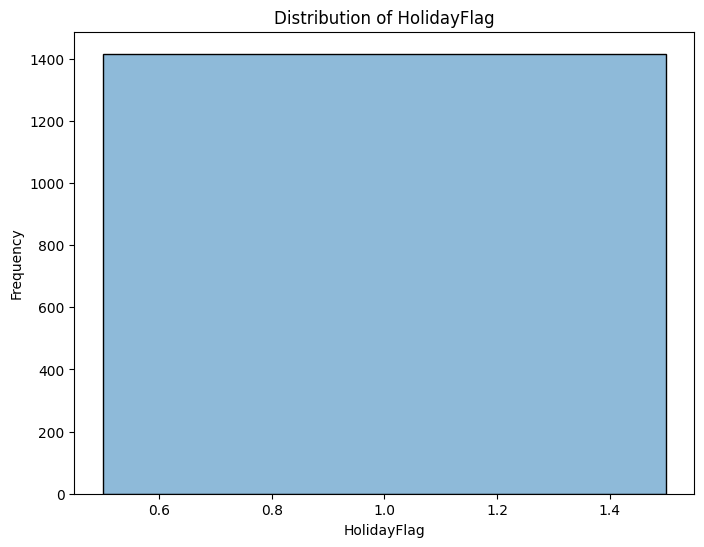

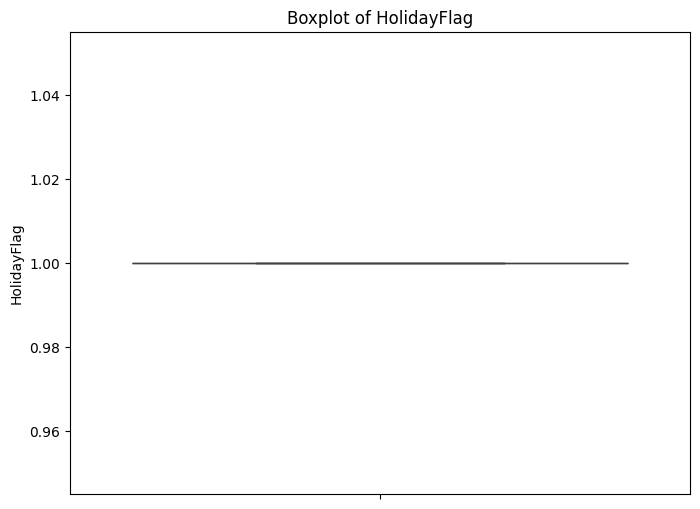

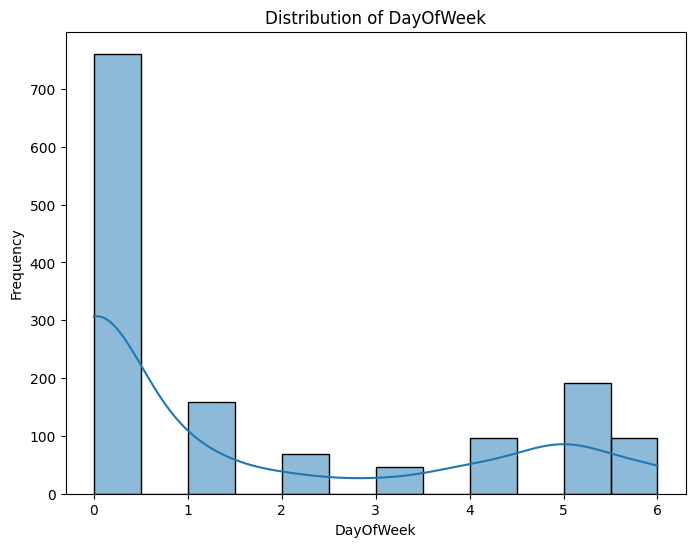

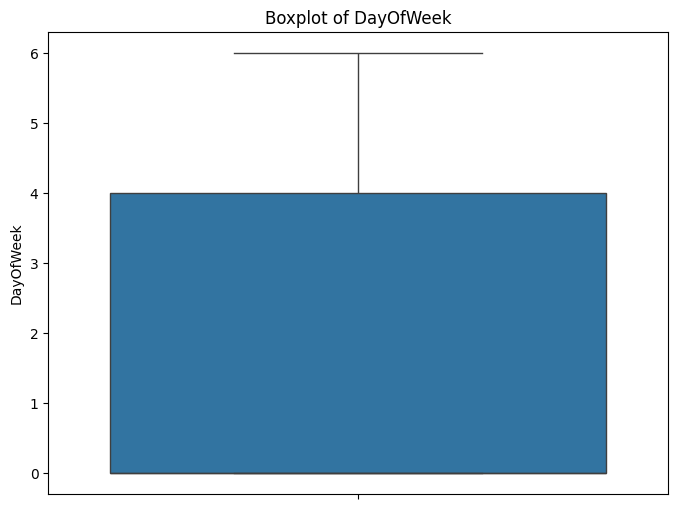

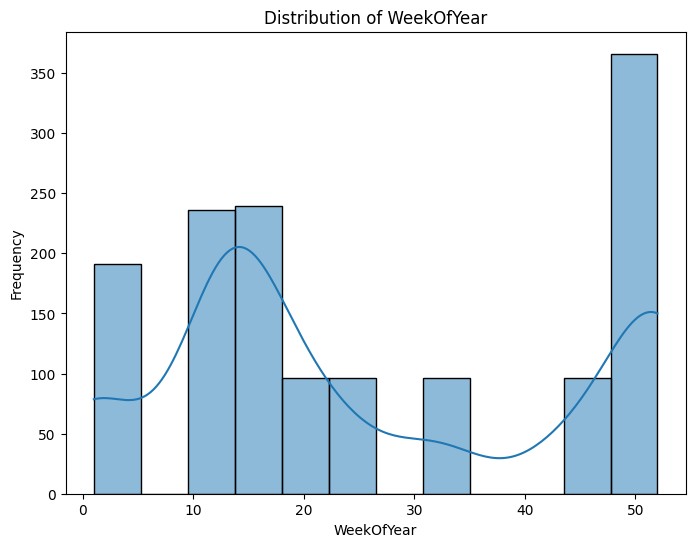

...

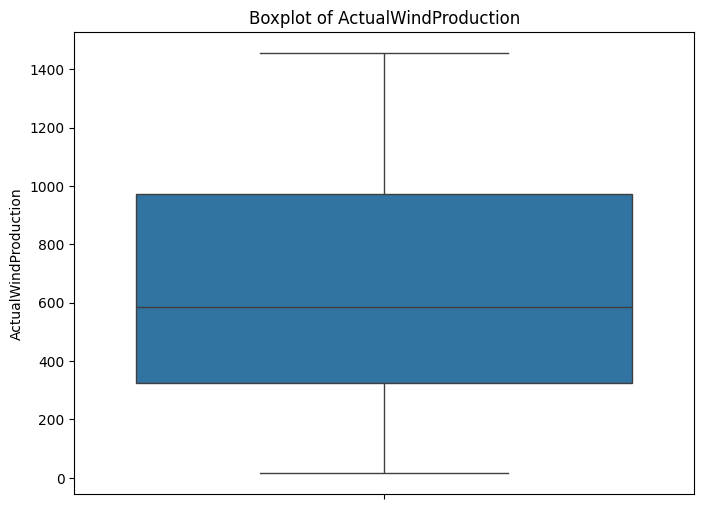

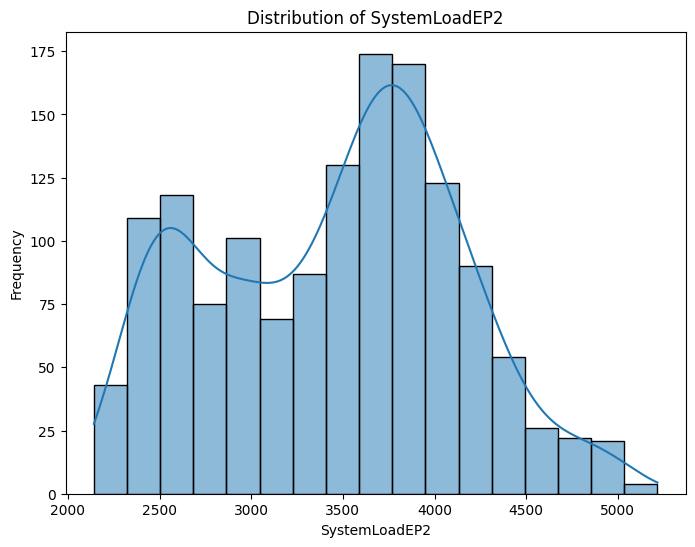

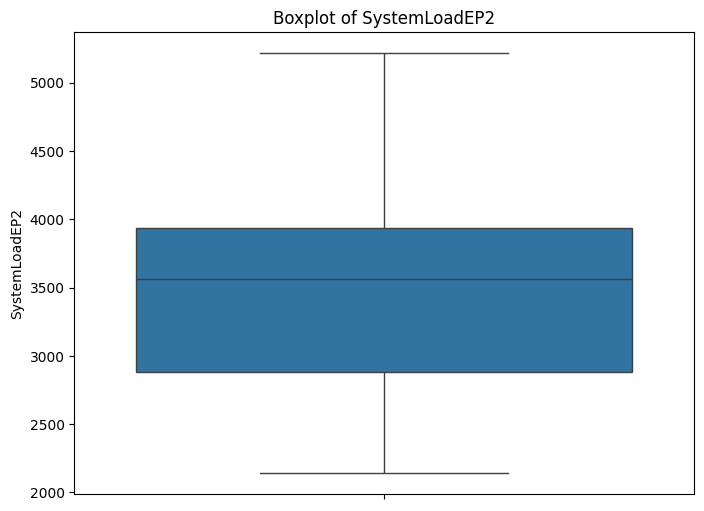

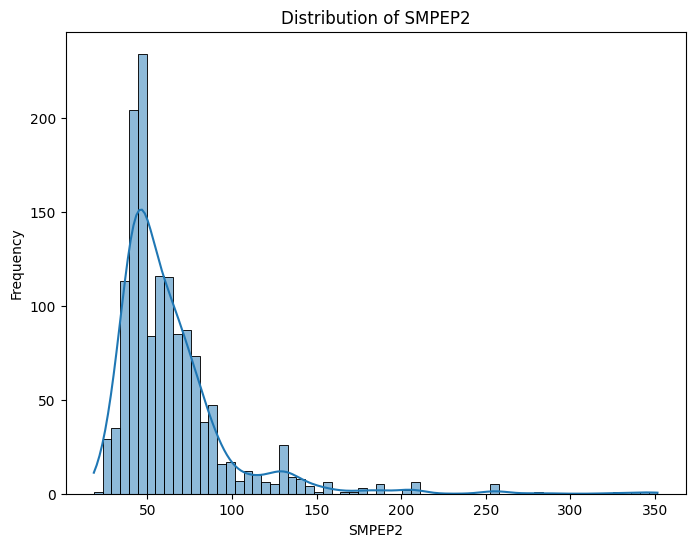

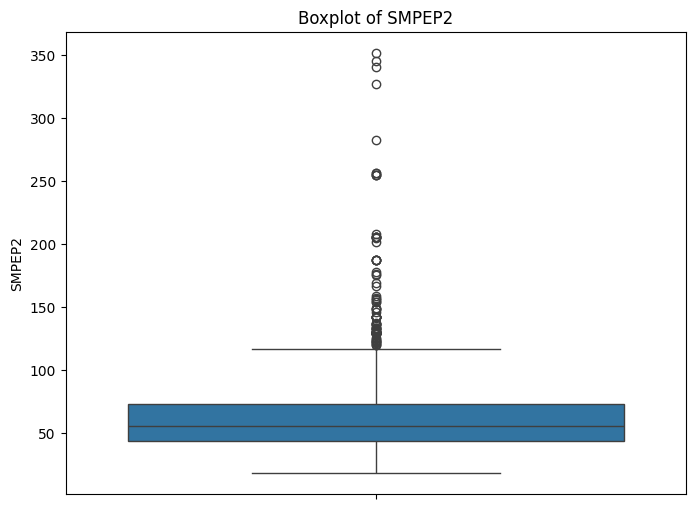

In [40]:
# distributions of numeric attributes# prompt: # distributions of numeric attributes

import matplotlib.pyplot as plt
for col in num_list:
  plt.figure(figsize=(8, 6))
  sns.histplot(df[col], kde=True)
  plt.title(f"Distribution of {col}")
  plt.xlabel(col)
  plt.ylabel("Frequency")
  plt.show()

  plt.figure(figsize=(8, 6))
  sns.boxplot(y=df[col])
  plt.title(f"Boxplot of {col}")
  plt.ylabel(col)
  plt.show()



In [41]:
num_list.append("ORKTemperature")
num_list

['HolidayFlag',
 'DayOfWeek',
 'WeekOfYear',
 'Day',
 'Month',
 'Year',
 'PeriodOfDay',
 'ForecastWindProduction',
 'SystemLoadEA',
 'SMPEA',
 'ORKTemperature',
 'ORKWindspeed',
 'CO2Intensity',
 'ActualWindProduction',
 'SystemLoadEP2',
 'SMPEP2',
 'ORKTemperature']

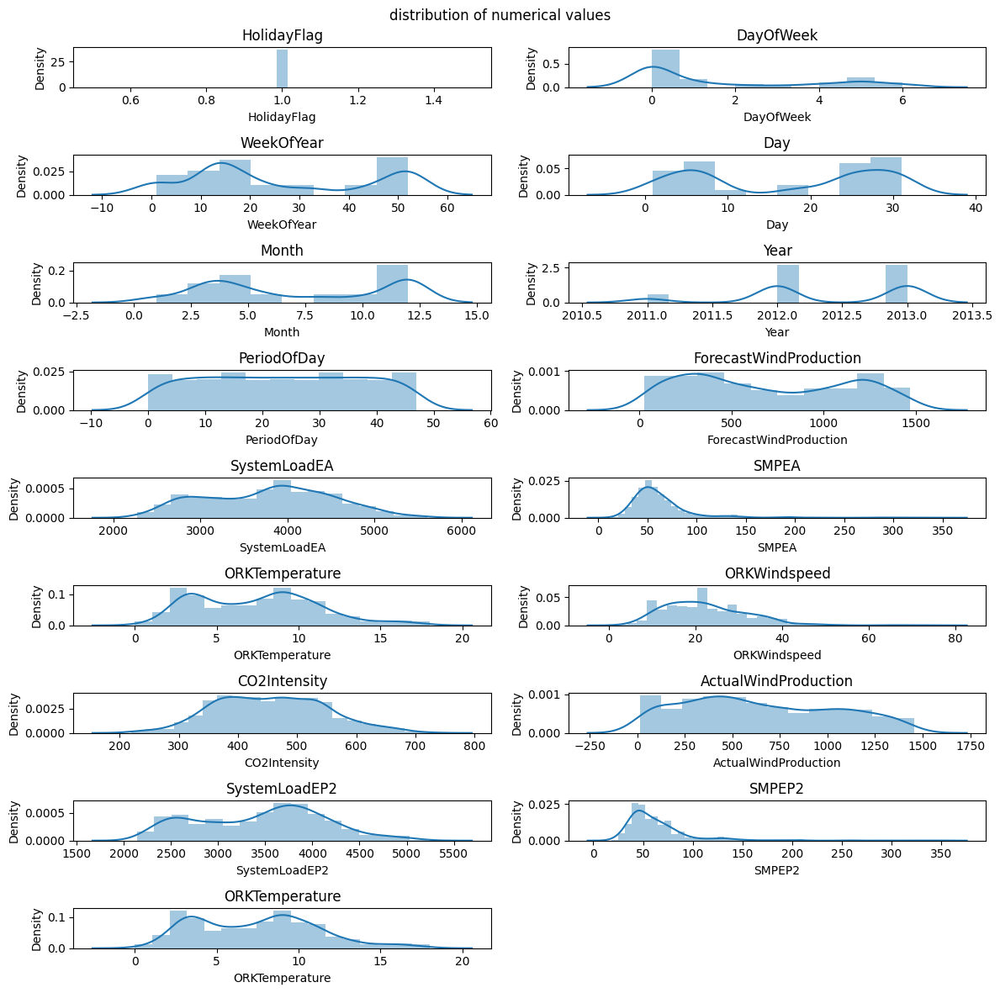

In [42]:
k=1
plt.figure(figsize=(12,12))
plt.suptitle("distribution of numerical values")

# Calculate the number of rows and columns needed
num_plots = len(num_list)
num_cols = 2  # You can adjust this if needed
num_rows = (num_plots + num_cols - 1) // num_cols  # Calculate rows dynamically

for i in df.loc[:,num_list]:
    plt.subplot(num_rows, num_cols, k)  # Use dynamic rows and columns
    sns.distplot(df[i])
    plt.title(i)
    k+=1
    plt.tight_layout()

<Axes: >

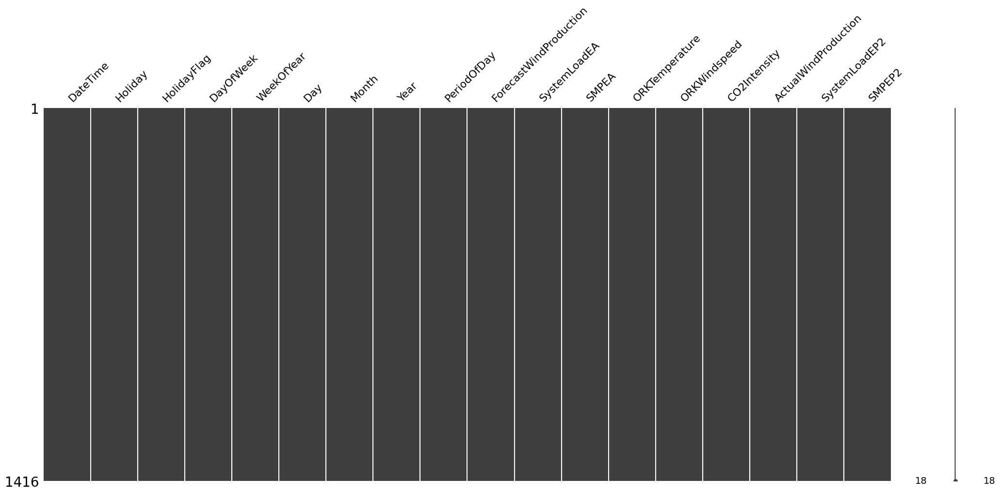

In [43]:
#Visualization of missing values¶
import missingno as msno
msno.matrix(df)



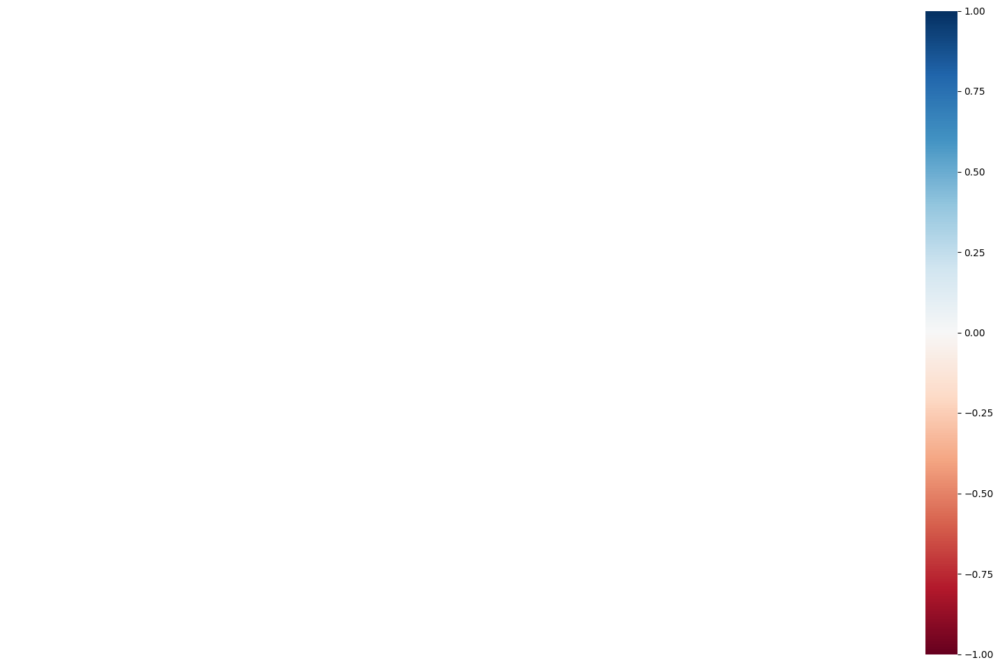

In [44]:
# let's visualize whether there is a relationship between the missing values
import matplotlib.pyplot as plt
msno.heatmap(df)
plt.show()


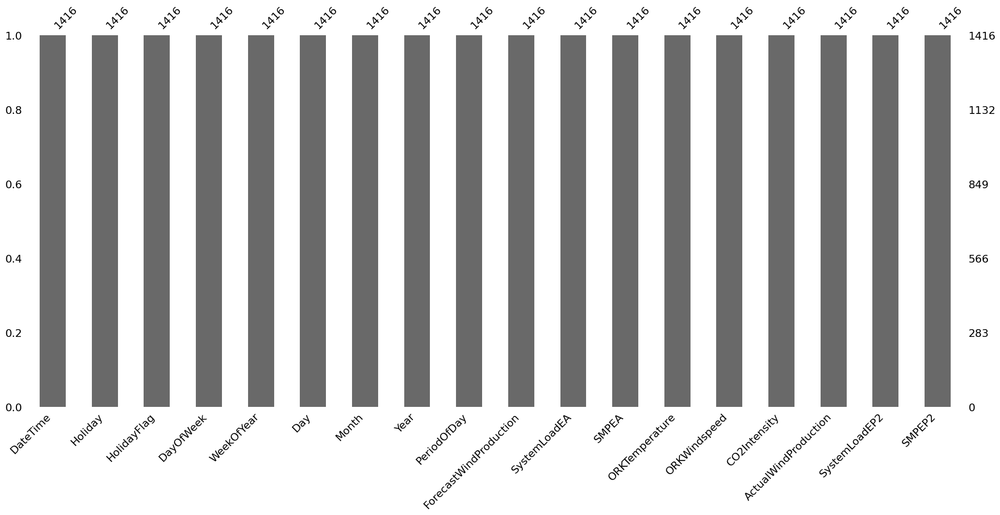

In [45]:
# missing values based on distribution states
df["ForecastWindProduction"].fillna(df.ForecastWindProduction.mean(),inplace=True)
df["SystemLoadEA"].fillna(df.SystemLoadEA.mean(),inplace=True)
df["SMPEA"].fillna(df.SMPEA.mean(),inplace=True)
df["CO2Intensity"].fillna(df.CO2Intensity.median(),inplace=True)
df["ActualWindProduction"].fillna(value=250,inplace=True)
df["SystemLoadEP2"].fillna(df.SystemLoadEP2.median(),inplace=True)
df["SMPEP2"].fillna(df.SMPEP2.median(),inplace=True)
msno.bar(df)
plt.show()




In [46]:
df["ORKTemperature"].fillna(value=10,inplace=True)
df["ORKWindspeed"].fillna(value=20,inplace=True)

In [47]:
df.isna().sum()


,0
DateTime,0
Holiday,0
HolidayFlag,0
DayOfWeek,0
WeekOfYear,0
Day,0
Month,0
Year,0
PeriodOfDay,0
ForecastWindProduction,0


In [48]:
# we have removed the missing values
#outlier
df.describe([0.05,0.1,0.25,0.35,0.5,0.65,0.75,0.9,0.95,0.98]).T



,count,mean,std,min,5%,10%,25%,35%,50%,65%,75%,90%,95%,98%,max
HolidayFlag,1416.0,1.000000,0.000000,1.00,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.000,1.00
DayOfWeek,1416.0,1.657486,2.179390,0.00,0.0000,0.000,0.0000,0.0000,0.000,2.0000,4.0000,5.000,6.0000,6.000,6.00
WeekOfYear,1416.0,26.034605,18.419020,1.00,1.0000,1.000,13.0000,14.0000,19.000,32.0000,51.0000,52.000,52.0000,52.000,52.00
Day,1416.0,17.084746,11.239501,1.00,1.0000,2.000,6.0000,7.0000,19.000,26.0000,28.0000,31.000,31.0000,31.000,31.00
Month,1416.0,7.115819,3.972432,1.00,1.0000,3.000,4.0000,4.0000,6.000,10.0000,12.0000,12.000,12.0000,12.000,12.00
Year,1416.0,2012.352401,0.653964,2011.00,2011.0000,2012.000,2012.0000,2012.0000,2012.000,2013.0000,2013.0000,2013.000,2013.0000,2013.000,2013.00
PeriodOfDay,1416.0,23.580508,13.803027,0.00,2.0000,5.000,12.0000,16.0000,24.000,31.0000,36.0000,43.000,45.0000,46.700,47.00
ForecastWindProduction,1416.0,697.087444,438.818133,26.53,89.5850,139.490,311.8350,400.0100,623.200,963.7725,1145.5525,1297.045,1401.9275,1438.216,1470.17
SystemLoadEA,1416.0,3786.745784,724.405027,2272.14,2639.6275,2768.255,3193.5700,3503.5150,3853.135,4109.2000,4317.2550,4735.610,4944.2700,5163.059,5607.32
SMPEA,1416.0,63.253171,34.996905,13.69,31.7500,36.445,44.5500,49.4525,55.290,63.5900,72.3875,90.690,125.4400,174.535,350.03


In [49]:
print(num_list)


['HolidayFlag', 'DayOfWeek', 'WeekOfYear', 'Day', 'Month', 'Year', 'PeriodOfDay', 'ForecastWindProduction', 'SystemLoadEA', 'SMPEA', 'ORKTemperature', 'ORKWindspeed', 'CO2Intensity', 'ActualWindProduction', 'SystemLoadEP2', 'SMPEP2', 'ORKTemperature']


In [50]:
out_list=["ForecastWindProduction","SystemLoadEA","SMPEA",
          "ORKWindspeed","SMPEP2"]


In [51]:
for i in df.loc[:,out_list]:
    Q1 = df[i].quantile(0.02)
    Q3 = df[i].quantile(0.98)
    IQR = Q3-Q1
    up = Q3 + 1.5*IQR
    low = Q1 - 1.5*IQR
    if df[(df[i] > up) | (df[i] < low)].any(axis=None):
        print(i,"yes")
    else:
        print(i, "no")

ForecastWindProduction no
SystemLoadEA no
SMPEA no
ORKWindspeed no
SMPEP2 no


In [52]:
#accessing outliers
def outliers_df(df):
    q1,q3=np.percentile(df,[0.02,0.98])
    ıqr=q3-q1
    low,high=q1-1.5*(ıqr),q3+1.5*(ıqr)
    outliers_train=[i for i in df if i<low or i>high]
    return outliers_train


In [53]:
len(outliers_df(df.SMPEA))


1141

In [54]:
len(outliers_df(df.SMPEP2))


1316

In [55]:
len(outliers_df(df.ORKTemperature))
print(len(outliers_df(df.SMPEA)))
print(len(outliers_df(df.SMPEP2)))
print(len(outliers_df(df.ORKTemperature)))
print(len(outliers_df(df.ORKWindspeed)))

1141
1316
1333
1314


In [56]:
df_remove_out=df.copy()


In [57]:
# remove outliers;

for i in df_remove_out.loc[:,out_list]:

    Q1 = df_remove_out[i].quantile(0.02)
    Q3 = df_remove_out[i].quantile(0.98)
    IQR = Q3 - Q1
    up_lim=Q3+1.5 *IQR
    low_lim=Q1-1.5 *IQR

    df_remove_out.loc[df_remove_out[i]>up_lim,i]=up_lim
    df_remove_out.loc[df_remove_out[i]<low_lim,i]=low_lim

In [58]:
for i in df_remove_out.loc[:,out_list]:
    Q1 = df_remove_out[i].quantile(0.02)
    Q3 = df_remove_out[i].quantile(0.98)
    IQR = Q3-Q1
    up = Q3 + 1.5*IQR
    low = Q1 - 1.5*IQR

    if df[(df_remove_out[i] > up) | (df_remove_out[i] < low)].any(axis=None):
        print(i,"yes")
    else:
        print(i, "no")

ForecastWindProduction no
SystemLoadEA no
SMPEA no
ORKWindspeed no
SMPEP2 no


In [59]:
df.describe([0.05,0.1,0.25,0.35,0.5,0.65,0.75,0.9,0.95,0.98]).T


,count,mean,std,min,5%,10%,25%,35%,50%,65%,75%,90%,95%,98%,max
HolidayFlag,1416.0,1.000000,0.000000,1.00,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.000,1.00
DayOfWeek,1416.0,1.657486,2.179390,0.00,0.0000,0.000,0.0000,0.0000,0.000,2.0000,4.0000,5.000,6.0000,6.000,6.00
WeekOfYear,1416.0,26.034605,18.419020,1.00,1.0000,1.000,13.0000,14.0000,19.000,32.0000,51.0000,52.000,52.0000,52.000,52.00
Day,1416.0,17.084746,11.239501,1.00,1.0000,2.000,6.0000,7.0000,19.000,26.0000,28.0000,31.000,31.0000,31.000,31.00
Month,1416.0,7.115819,3.972432,1.00,1.0000,3.000,4.0000,4.0000,6.000,10.0000,12.0000,12.000,12.0000,12.000,12.00
Year,1416.0,2012.352401,0.653964,2011.00,2011.0000,2012.000,2012.0000,2012.0000,2012.000,2013.0000,2013.0000,2013.000,2013.0000,2013.000,2013.00
PeriodOfDay,1416.0,23.580508,13.803027,0.00,2.0000,5.000,12.0000,16.0000,24.000,31.0000,36.0000,43.000,45.0000,46.700,47.00
ForecastWindProduction,1416.0,697.087444,438.818133,26.53,89.5850,139.490,311.8350,400.0100,623.200,963.7725,1145.5525,1297.045,1401.9275,1438.216,1470.17
SystemLoadEA,1416.0,3786.745784,724.405027,2272.14,2639.6275,2768.255,3193.5700,3503.5150,3853.135,4109.2000,4317.2550,4735.610,4944.2700,5163.059,5607.32
SMPEA,1416.0,63.253171,34.996905,13.69,31.7500,36.445,44.5500,49.4525,55.290,63.5900,72.3875,90.690,125.4400,174.535,350.03


In [60]:
df_remove_out.describe([0.05,0.1,0.25,0.35,0.5,0.65,0.75,0.9,0.95,0.98]).T


,count,mean,std,min,5%,10%,25%,35%,50%,65%,75%,90%,95%,98%,max
HolidayFlag,1416.0,1.000000,0.000000,1.00,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.0000,1.000,1.0000,1.000,1.00
DayOfWeek,1416.0,1.657486,2.179390,0.00,0.0000,0.000,0.0000,0.0000,0.000,2.0000,4.0000,5.000,6.0000,6.000,6.00
WeekOfYear,1416.0,26.034605,18.419020,1.00,1.0000,1.000,13.0000,14.0000,19.000,32.0000,51.0000,52.000,52.0000,52.000,52.00
Day,1416.0,17.084746,11.239501,1.00,1.0000,2.000,6.0000,7.0000,19.000,26.0000,28.0000,31.000,31.0000,31.000,31.00
Month,1416.0,7.115819,3.972432,1.00,1.0000,3.000,4.0000,4.0000,6.000,10.0000,12.0000,12.000,12.0000,12.000,12.00
Year,1416.0,2012.352401,0.653964,2011.00,2011.0000,2012.000,2012.0000,2012.0000,2012.000,2013.0000,2013.0000,2013.000,2013.0000,2013.000,2013.00
PeriodOfDay,1416.0,23.580508,13.803027,0.00,2.0000,5.000,12.0000,16.0000,24.000,31.0000,36.0000,43.000,45.0000,46.700,47.00
ForecastWindProduction,1416.0,697.087444,438.818133,26.53,89.5850,139.490,311.8350,400.0100,623.200,963.7725,1145.5525,1297.045,1401.9275,1438.216,1470.17
SystemLoadEA,1416.0,3786.745784,724.405027,2272.14,2639.6275,2768.255,3193.5700,3503.5150,3853.135,4109.2000,4317.2550,4735.610,4944.2700,5163.059,5607.32
SMPEA,1416.0,63.253171,34.996905,13.69,31.7500,36.445,44.5500,49.4525,55.290,63.5900,72.3875,90.690,125.4400,174.535,350.03


In [61]:
from datetime import datetime
df["DateTime"] = pd.to_datetime(df.DateTime)
df["DateTime"]


,DateTime
2544,2011-12-24 00:00:00
2545,2011-12-24 00:30:00
2546,2011-12-24 01:00:00
2547,2011-12-24 01:30:00
2548,2011-12-24 02:00:00
...,...
38009,2013-12-31 21:30:00
38010,2013-12-31 22:00:00
38011,2013-12-31 22:30:00
38012,2013-12-31 23:00:00


In [62]:
df['Day']=df['DateTime'].dt.day
df['Month']=df['DateTime'].dt.month
df['Year']=df['DateTime'].dt.year
df['DayOfYear']=df['DateTime'].dt.dayofyear
df['DayOfWeek']=df['DateTime'].dt.dayofweek
df['Quarter']=df['DateTime'].dt.quarter
df['Hour']=df['DateTime'].dt.hour
df['Minute']=df['DateTime'].dt.minute
df['Second']=df['DateTime'].dt.second
print(df['Day'])
print(df['Month'])
print(df['Year'])
print(df['DayOfYear'])
print(df['DayOfWeek'])
print(df['Quarter'])
print(df['Hour'])



2544     24
2545     24
2546     24
2547     24
2548     24
         ..
38009    31
38010    31
38011    31
38012    31
38013    31
Name: Day, Length: 1416, dtype: int32
2544     12
2545     12
2546     12
2547     12
2548     12
         ..
38009    12
38010    12
38011    12
38012    12
38013    12
Name: Month, Length: 1416, dtype: int32
2544     2011
2545     2011
2546     2011
2547     2011
2548     2011
         ... 
38009    2013
38010    2013
38011    2013
38012    2013
38013    2013
Name: Year, Length: 1416, dtype: int32
2544     358
2545     358
2546     358
2547     358
2548     358
        ... 
38009    365
38010    365
38011    365
38012    365
38013    365
Name: DayOfYear, Length: 1416, dtype: int32
2544     5
2545     5
2546     5
2547     5
2548     5
        ..
38009    1
38010    1
38011    1
38012    1
38013    1
Name: DayOfWeek, Length: 1416, dtype: int32
2544     4
2545     4
2546     4
2547     4
2548     4
        ..
38009    4
38010    4
38011    4
38012    4
380

In [63]:
y=df['SMPEA']
X=df[['SystemLoadEA','ORKTemperature','ORKWindspeed','ActualWindProduction','ForecastWindProduction','CO2Intensity','DayOfWeek','Month','Hour']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Choose a model (e.g., RandomForestRegressor, GradientBoostingRegressor, etc.)
model = RandomForestRegressor()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)
print(y_pred)
print(y_test)
# Make predictions on the test set
y_pred = model.predict(X_test)
print(y_pred)
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")



[ 92.9119  90.4825  50.0237  55.1996  53.7275  44.4872  39.9961  50.1339
  79.6098  59.2272  86.7389  42.0512  31.9825 175.1664  41.0566  75.1615
  71.2906  48.6304  50.7495  64.0101 124.9405  68.332   50.5656  45.8766
  58.9215  58.04    79.6329  91.3371  76.6589  57.9434  45.6836  52.6826
  41.6984  50.7906  83.7035  51.7752  60.3142  43.3523  50.2051  47.2293
  61.5379  56.0593  75.1542 135.0427  55.5724  78.7819  38.6649  74.186
  62.2431  71.1752  59.1951  51.4635  45.1327  67.4153  49.7062  45.9215
  65.1308  44.6884  60.6608  33.7393  75.7459  52.3138  71.1899  82.6108
  54.5079  52.0016  54.3378  58.1262  59.2332  58.594   64.5887  62.8014
  55.5685  65.6628  82.6402  56.1333  50.6628  44.9355  62.2177 172.3234
  80.0445  48.9572  46.81    65.7877  86.4936  40.0018  75.0412  79.5391
  49.244   43.4299  52.5393  66.4864  37.6251  48.5091  38.4557  73.7696
  37.9005  66.3018  47.3783 126.3593  74.5818  52.1189  61.7068  72.5082
  56.2387  61.1117  39.3671  39.0863  64.1015  95.43

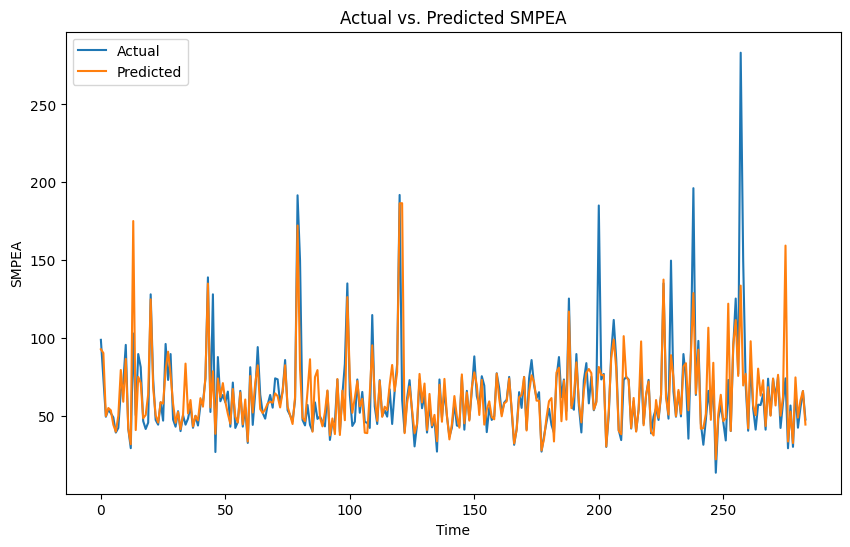

In [64]:
# Visualization of results
plt.figure(figsize=(10, 6))
plt.plot(y_test.values, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.title('Actual vs. Predicted SMPEA')
plt.xlabel('Time')
plt.ylabel('SMPEA')
plt.legend()
plt.show()

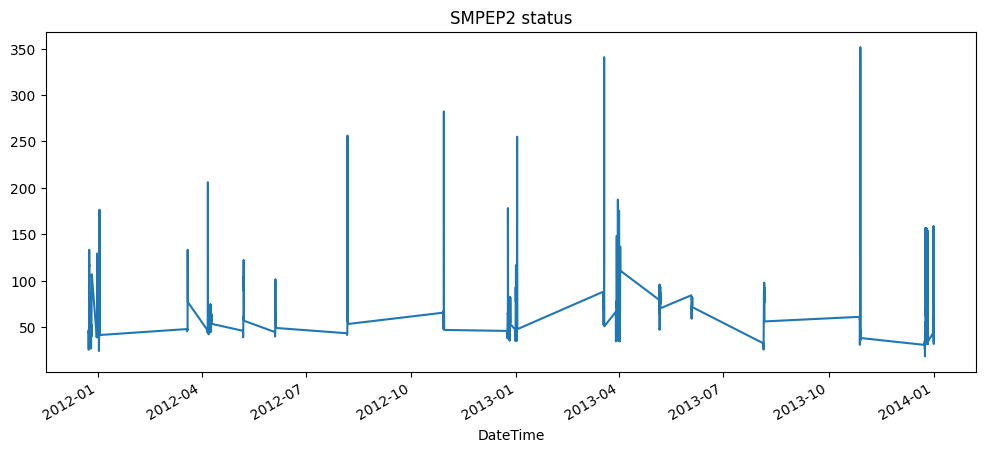

In [65]:
custgroup = df.groupby('DateTime').agg({
    'SMPEP2': 'mean',  # Calculate mean for numeric columns
    'Holiday': 'first'  # Or any other aggregation for 'Holiday'
    # like 'last', 'mode', etc.
})
plt.figure(figsize=(12, 5))
custgroup['SMPEP2'].plot(x=custgroup.index)  # Use the index for x-axis
plt.title("SMPEP2 status")
plt.show()

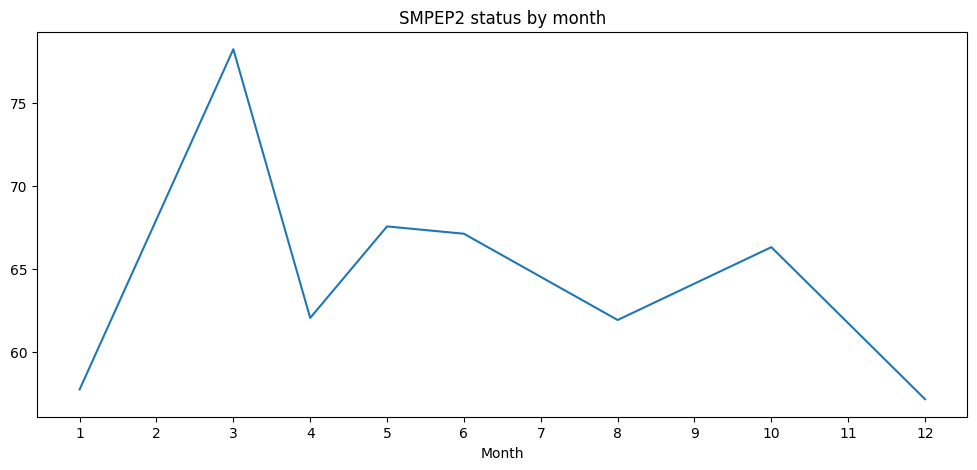

In [66]:
# There is ancust increase between 2010 and 2015
custgroup=df.groupby('Month').agg({'SMPEP2':'mean'}) # Only calculate mean for SMPEP2
fig,ax=plt.subplots(figsize=(12,5))
ax.xaxis.set(ticks=range(0,13))  # Assuming Month is numeric 0-12.
# If Month is string, use the string values themselves as tick labels.
custgroup['SMPEP2'].plot(x=custgroup.index)  # Use the index of custgroup for x-axis
plt.title("SMPEP2 status by month")
plt.show()

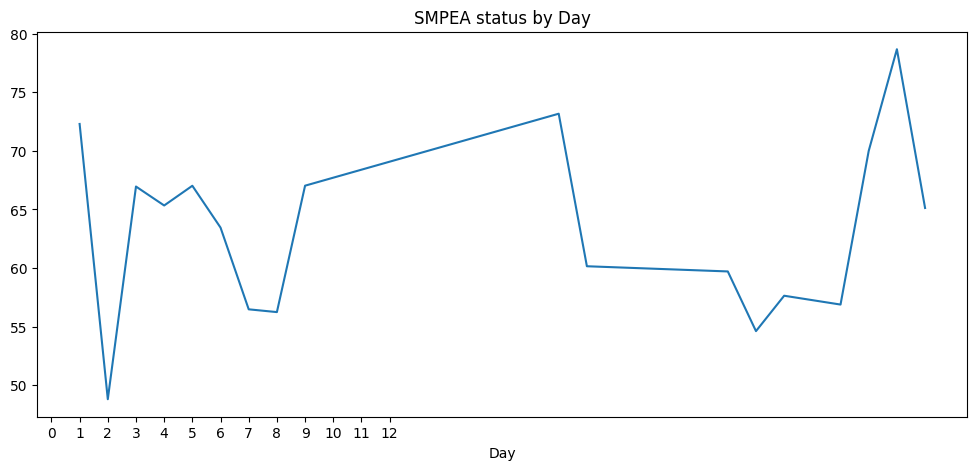

In [67]:
# change in electricity price by months, there is an increase in the 3rd month at most
custgroup=df.groupby('Day').agg({'SMPEA':'mean'}) # Only calculate mean for SMPEA
fig,ax=plt.subplots(figsize=(12,5))
ax.xaxis.set(ticks=range(0,13))
custgroup['SMPEA'].plot(x=custgroup.index)
plt.title("SMPEA status by Day")
plt.show()


In [68]:
# let's make the necessary updates in df_remove_out;
df_remove_out["DateTime"] = pd.to_datetime(df_remove_out.DateTime)
df_remove_out



,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2
2544,2011-12-24 00:00:00,Christmas Eve,1,5,51,24,12,2011,0,718.70,4153.59,44.96,2.0,11.1,477.20,666.0,3634.24,44.96
2545,2011-12-24 00:30:00,Christmas Eve,1,5,51,24,12,2011,1,741.10,3896.85,44.54,3.0,18.5,467.15,641.0,3382.16,44.96
2546,2011-12-24 01:00:00,Christmas Eve,1,5,51,24,12,2011,2,768.00,3679.45,42.73,3.0,16.7,469.53,644.0,3204.06,44.54
2547,2011-12-24 01:30:00,Christmas Eve,1,5,51,24,12,2011,3,806.90,3510.25,41.72,4.0,14.8,467.95,645.0,2997.83,43.48
2548,2011-12-24 02:00:00,Christmas Eve,1,5,51,24,12,2011,4,845.90,3363.41,41.56,3.0,11.1,470.66,693.0,2831.80,41.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,2013-12-31 21:30:00,New Year's Eve,1,1,1,31,12,2013,43,1179.14,3932.22,34.51,6.0,22.2,285.31,812.0,3692.95,42.45
38010,2013-12-31 22:00:00,New Year's Eve,1,1,1,31,12,2013,44,1152.01,3821.44,33.83,5.0,24.1,278.31,852.0,3571.00,33.83
38011,2013-12-31 22:30:00,New Year's Eve,1,1,1,31,12,2013,45,1123.67,3724.21,31.75,4.0,20.4,280.91,962.0,3460.29,31.75
38012,2013-12-31 23:00:00,New Year's Eve,1,1,1,31,12,2013,46,1094.24,3638.16,33.83,5.0,14.8,302.46,950.0,3563.99,50.60


In [69]:
df_remove_out['year'] = df_remove_out['DateTime'].dt.year
df_remove_out['month'] = df_remove_out['DateTime'].dt.month
df_remove_out["day"]=df_remove_out["DateTime"].dt.day


In [70]:
df_remove_out


,DateTime,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,...,SMPEA,ORKTemperature,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2,year,month,day
2544,2011-12-24 00:00:00,Christmas Eve,1,5,51,24,12,2011,0,718.70,...,44.96,2.0,11.1,477.20,666.0,3634.24,44.96,2011,12,24
2545,2011-12-24 00:30:00,Christmas Eve,1,5,51,24,12,2011,1,741.10,...,44.54,3.0,18.5,467.15,641.0,3382.16,44.96,2011,12,24
2546,2011-12-24 01:00:00,Christmas Eve,1,5,51,24,12,2011,2,768.00,...,42.73,3.0,16.7,469.53,644.0,3204.06,44.54,2011,12,24
2547,2011-12-24 01:30:00,Christmas Eve,1,5,51,24,12,2011,3,806.90,...,41.72,4.0,14.8,467.95,645.0,2997.83,43.48,2011,12,24
2548,2011-12-24 02:00:00,Christmas Eve,1,5,51,24,12,2011,4,845.90,...,41.56,3.0,11.1,470.66,693.0,2831.80,41.72,2011,12,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,2013-12-31 21:30:00,New Year's Eve,1,1,1,31,12,2013,43,1179.14,...,34.51,6.0,22.2,285.31,812.0,3692.95,42.45,2013,12,31
38010,2013-12-31 22:00:00,New Year's Eve,1,1,1,31,12,2013,44,1152.01,...,33.83,5.0,24.1,278.31,852.0,3571.00,33.83,2013,12,31
38011,2013-12-31 22:30:00,New Year's Eve,1,1,1,31,12,2013,45,1123.67,...,31.75,4.0,20.4,280.91,962.0,3460.29,31.75,2013,12,31
38012,2013-12-31 23:00:00,New Year's Eve,1,1,1,31,12,2013,46,1094.24,...,33.83,5.0,14.8,302.46,950.0,3563.99,50.60,2013,12,31


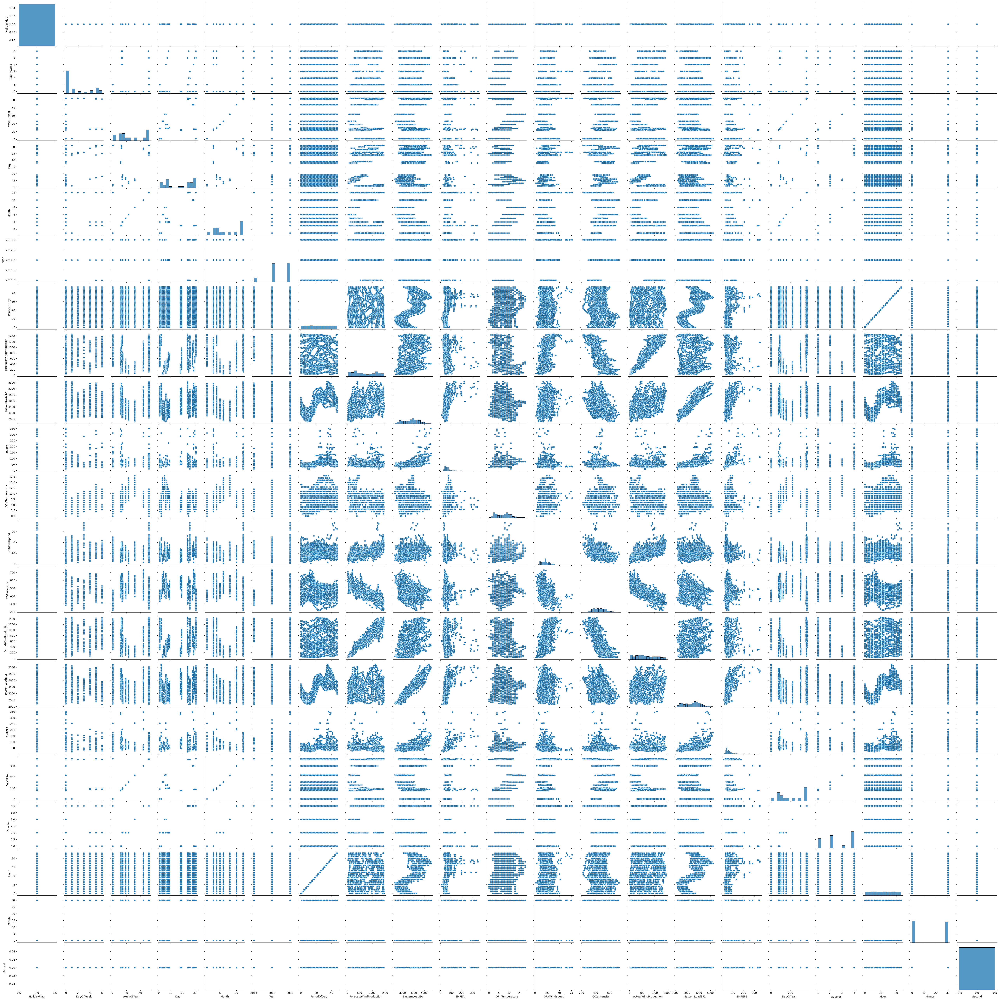

In [71]:
#Data Visualize¶
sns.pairplot(df)

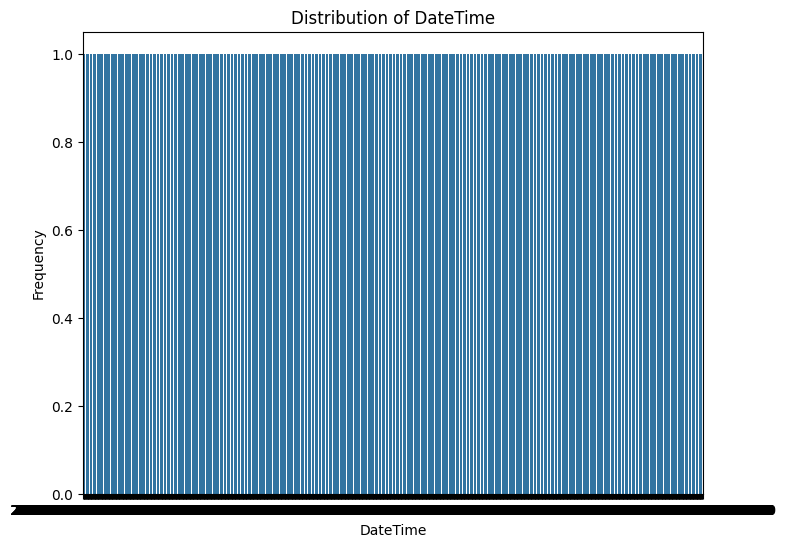

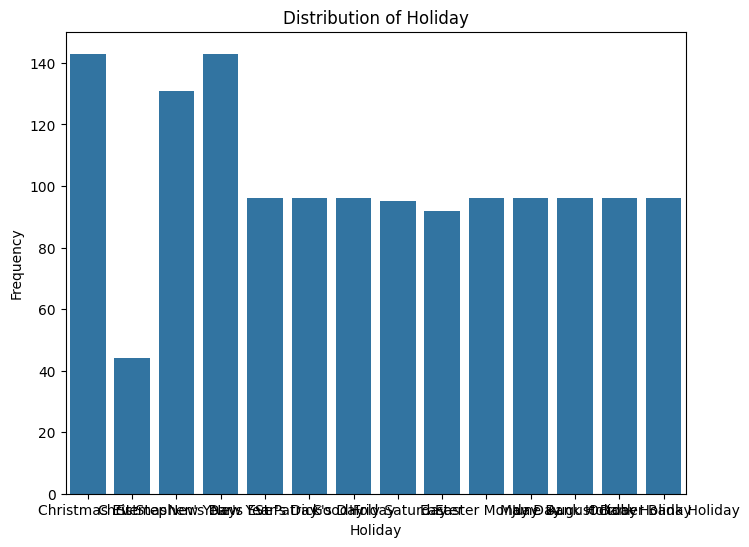

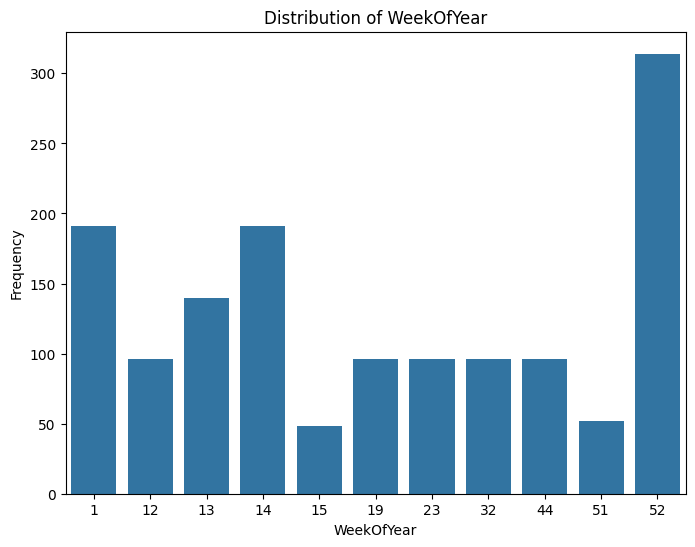

In [72]:
# Categoricakl Analysis
for i in cat_list:
  plt.figure(figsize=(8, 6), dpi=100)
  sns.countplot(x=df[i])
  plt.title(f"Distribution of {i}")
  plt.xlabel(i)
  plt.ylabel("Frequency")
  plt.show()

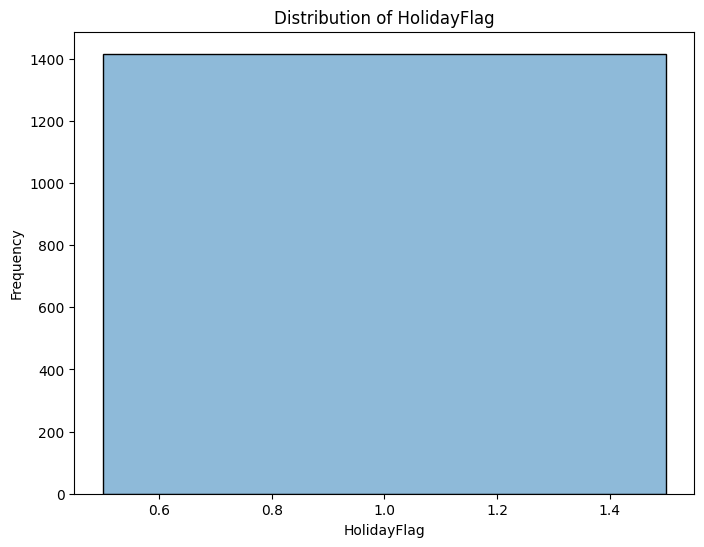

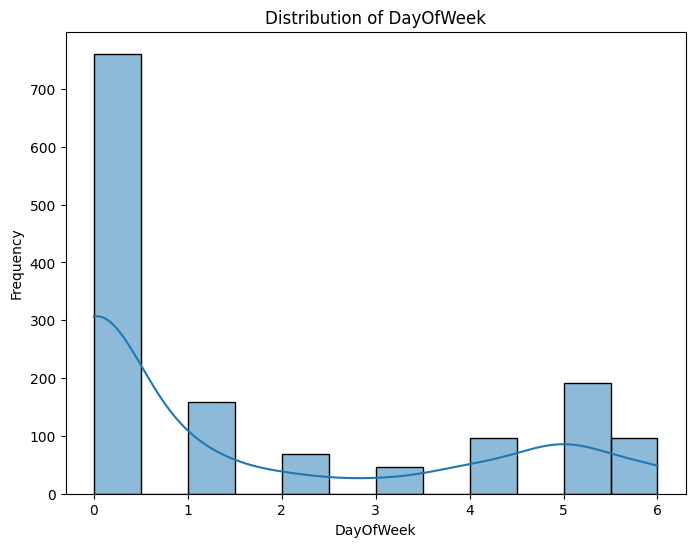

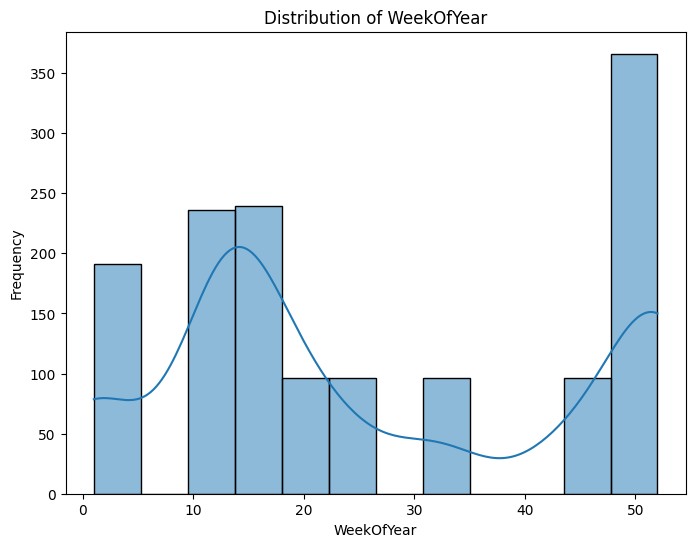

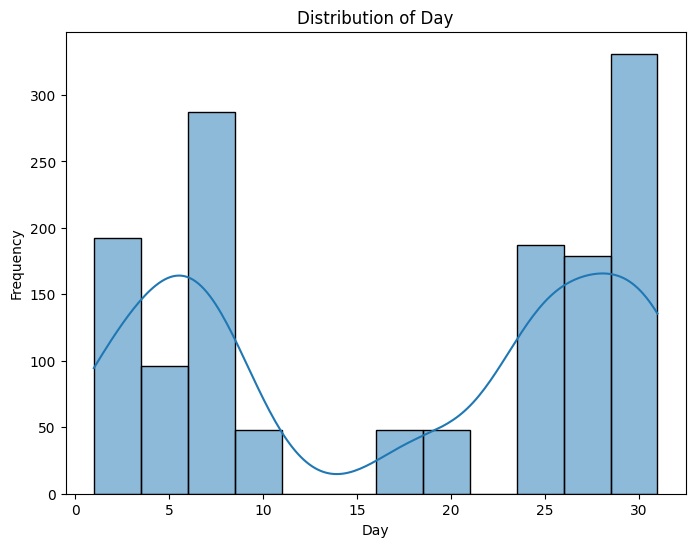

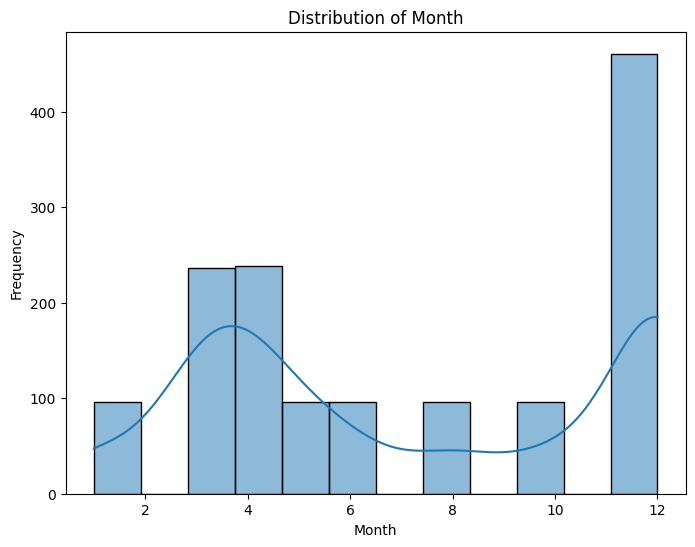

...

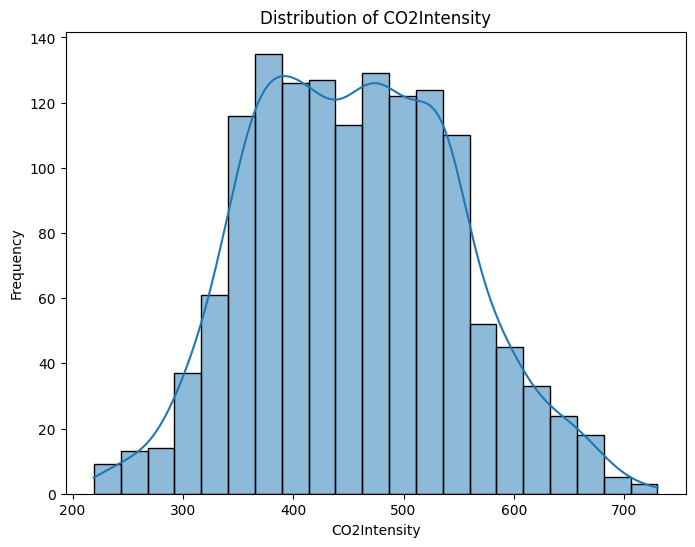

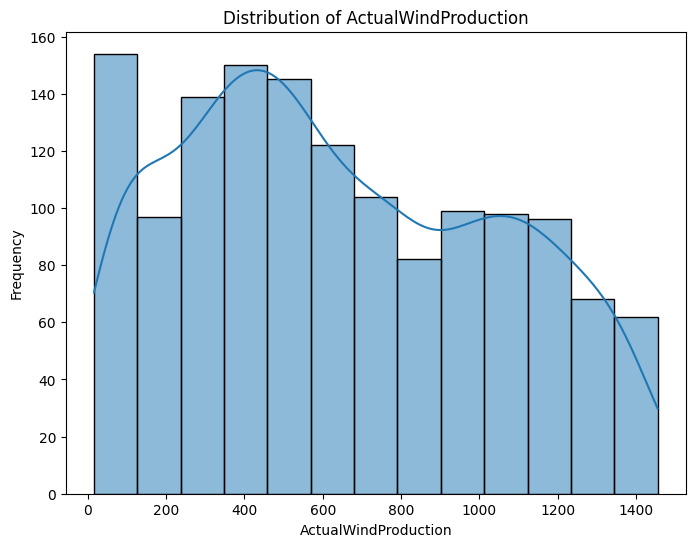

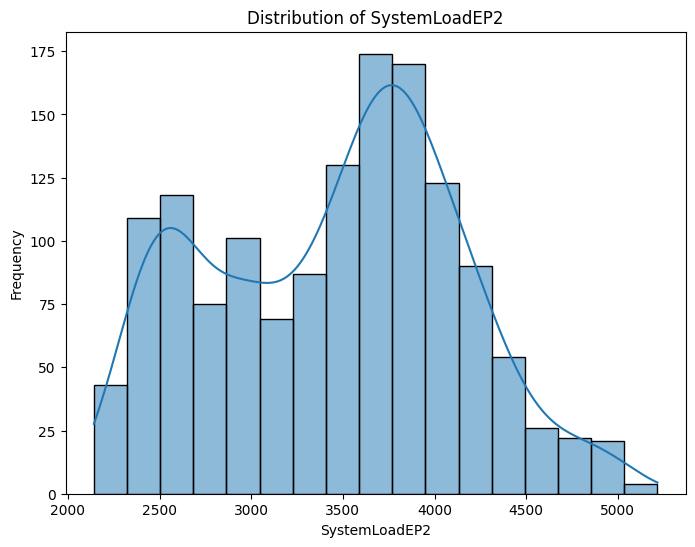

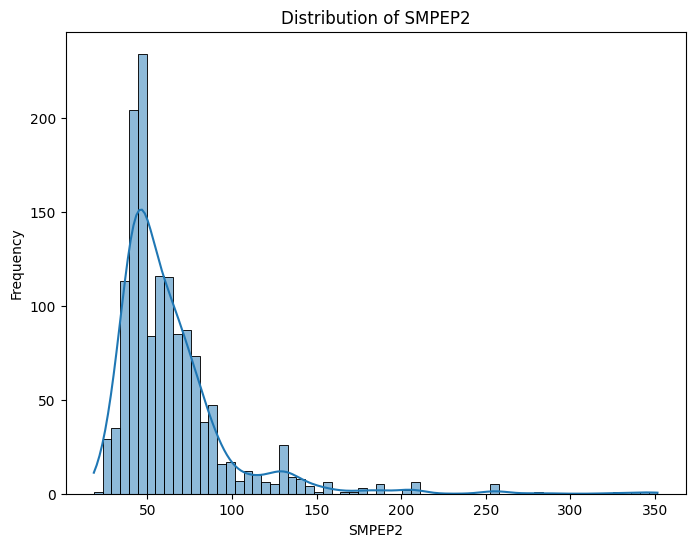

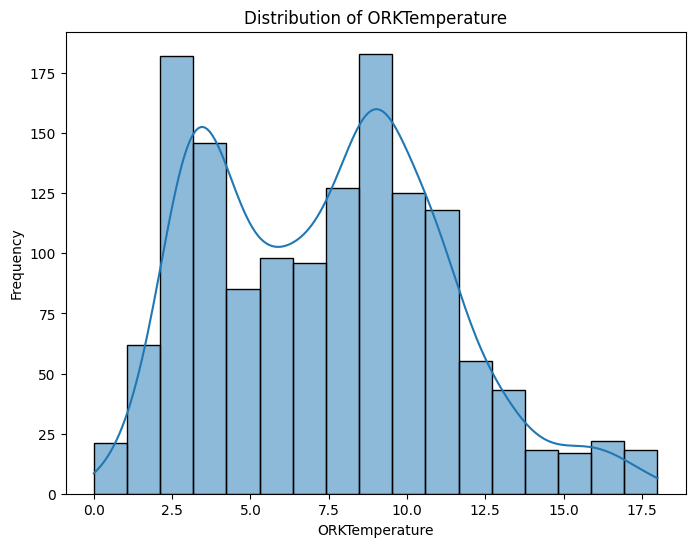

In [73]:
#hist
for i in num_list:
  plt.figure(figsize=(8, 6))
  sns.histplot(df[i], kde=True)
  plt.title(f"Distribution of {i}")
  plt.xlabel(i)
  plt.ylabel("Frequency")
  plt.show()

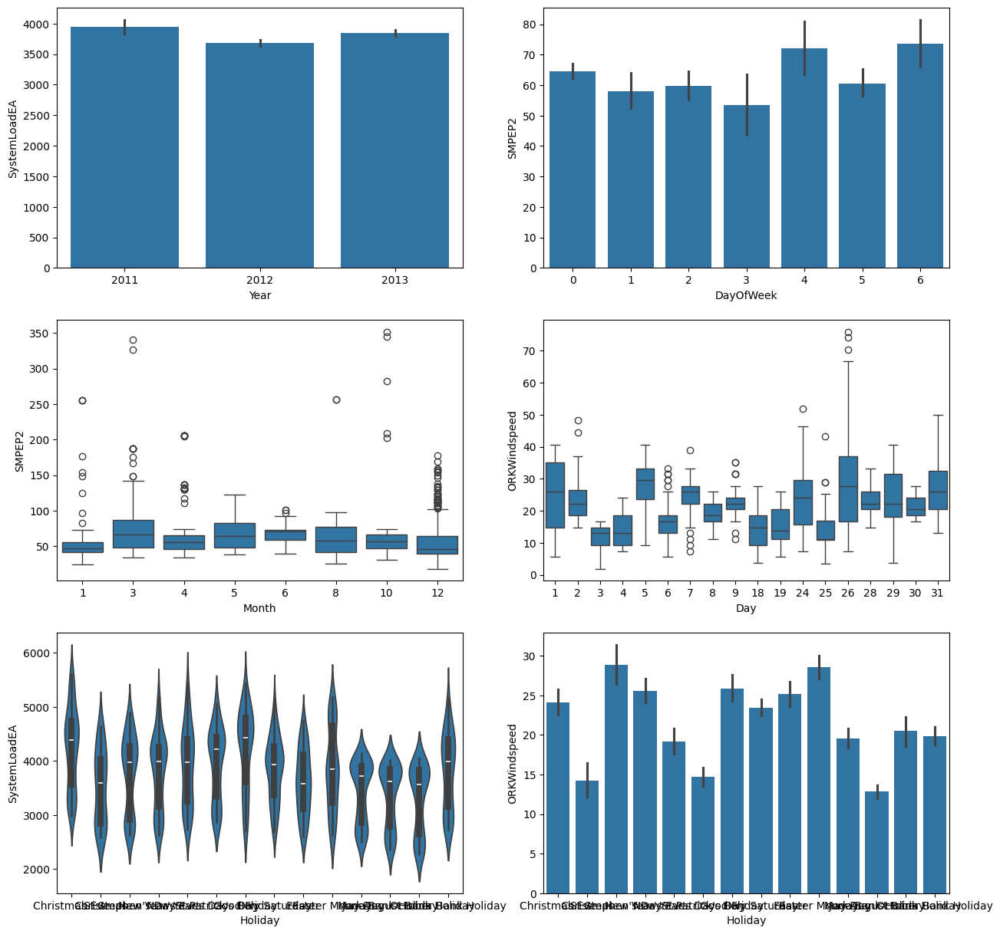

In [74]:
plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
sns.barplot(x ='Year',y ='SystemLoadEA',data = df)
plt.subplot(3,2,2)
sns.barplot(x="DayOfWeek",y="SMPEP2",data=df)
plt.subplot(3,2,3)
sns.boxplot(x="Month",y="SMPEP2",data=df)
plt.subplot(3,2,4)
sns.boxplot(x="Day",y="ORKWindspeed",data=df)
plt.subplot(3,2,5)
sns.violinplot(x="Holiday",y="SystemLoadEA",data=df)
plt.subplot(3,2,6)
sns.barplot(x="Holiday",y="ORKWindspeed",data=df)
plt.show()

In [75]:
df.drop("DateTime",axis=1,inplace=True)


In [76]:
df.head(2)


,Holiday,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,...,ORKWindspeed,CO2Intensity,ActualWindProduction,SystemLoadEP2,SMPEP2,DayOfYear,Quarter,Hour,Minute,Second
2544,Christmas Eve,1,5,51,24,12,2011,0,718.7,4153.59,...,11.1,477.20,666.0,3634.24,44.96,358,4,0,0,0
2545,Christmas Eve,1,5,51,24,12,2011,1,741.1,3896.85,...,18.5,467.15,641.0,3382.16,44.96,358,4,0,30,0


In [77]:
#Encoding¶
dms=pd.get_dummies(df["Holiday"])
dms


,August Bank Holiday,Christmas,Christmas Eve,Easter,Easter Monday,Good Friday,Holy Saturday,June Bank Holiday,May Day,New Year's Day,New Year's Eve,October Bank Holiday,St Patrick's Day,St Stephen's Day
2544,False,False,True,False,False,False,False,False,False,False,False,False,False,False
2545,False,False,True,False,False,False,False,False,False,False,False,False,False,False
2546,False,False,True,False,False,False,False,False,False,False,False,False,False,False
2547,False,False,True,False,False,False,False,False,False,False,False,False,False,False
2548,False,False,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38009,False,False,False,False,False,False,False,False,False,False,True,False,False,False
38010,False,False,False,False,False,False,False,False,False,False,True,False,False,False
38011,False,False,False,False,False,False,False,False,False,False,True,False,False,False
38012,False,False,False,False,False,False,False,False,False,False,True,False,False,False


In [78]:
df.drop("Holiday",axis=1,inplace=True)
df=pd.concat([df,dms],axis=1)

df.head()

,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,SMPEA,...,Easter Monday,Good Friday,Holy Saturday,June Bank Holiday,May Day,New Year's Day,New Year's Eve,October Bank Holiday,St Patrick's Day,St Stephen's Day
2544,1,5,51,24,12,2011,0,718.7,4153.59,44.96,...,False,False,False,False,False,False,False,False,False,False
2545,1,5,51,24,12,2011,1,741.1,3896.85,44.54,...,False,False,False,False,False,False,False,False,False,False
2546,1,5,51,24,12,2011,2,768.0,3679.45,42.73,...,False,False,False,False,False,False,False,False,False,False
2547,1,5,51,24,12,2011,3,806.9,3510.25,41.72,...,False,False,False,False,False,False,False,False,False,False
2548,1,5,51,24,12,2011,4,845.9,3363.41,41.56,...,False,False,False,False,False,False,False,False,False,False


In [79]:
dms2=pd.get_dummies(df_remove_out["Holiday"])
df_remove_out.drop("Holiday",axis=1,inplace=True)
df_remove_out=pd.concat([df_remove_out,dms2],axis=1)

df_remove_out.head()

,DateTime,HolidayFlag,DayOfWeek,WeekOfYear,Day,Month,Year,PeriodOfDay,ForecastWindProduction,SystemLoadEA,...,Easter Monday,Good Friday,Holy Saturday,June Bank Holiday,May Day,New Year's Day,New Year's Eve,October Bank Holiday,St Patrick's Day,St Stephen's Day
2544,2011-12-24 00:00:00,1,5,51,24,12,2011,0,718.7,4153.59,...,False,False,False,False,False,False,False,False,False,False
2545,2011-12-24 00:30:00,1,5,51,24,12,2011,1,741.1,3896.85,...,False,False,False,False,False,False,False,False,False,False
2546,2011-12-24 01:00:00,1,5,51,24,12,2011,2,768.0,3679.45,...,False,False,False,False,False,False,False,False,False,False
2547,2011-12-24 01:30:00,1,5,51,24,12,2011,3,806.9,3510.25,...,False,False,False,False,False,False,False,False,False,False
2548,2011-12-24 02:00:00,1,5,51,24,12,2011,4,845.9,3363.41,...,False,False,False,False,False,False,False,False,False,False


In [80]:
df_remove_out.drop("DateTime",axis=1,inplace=True)


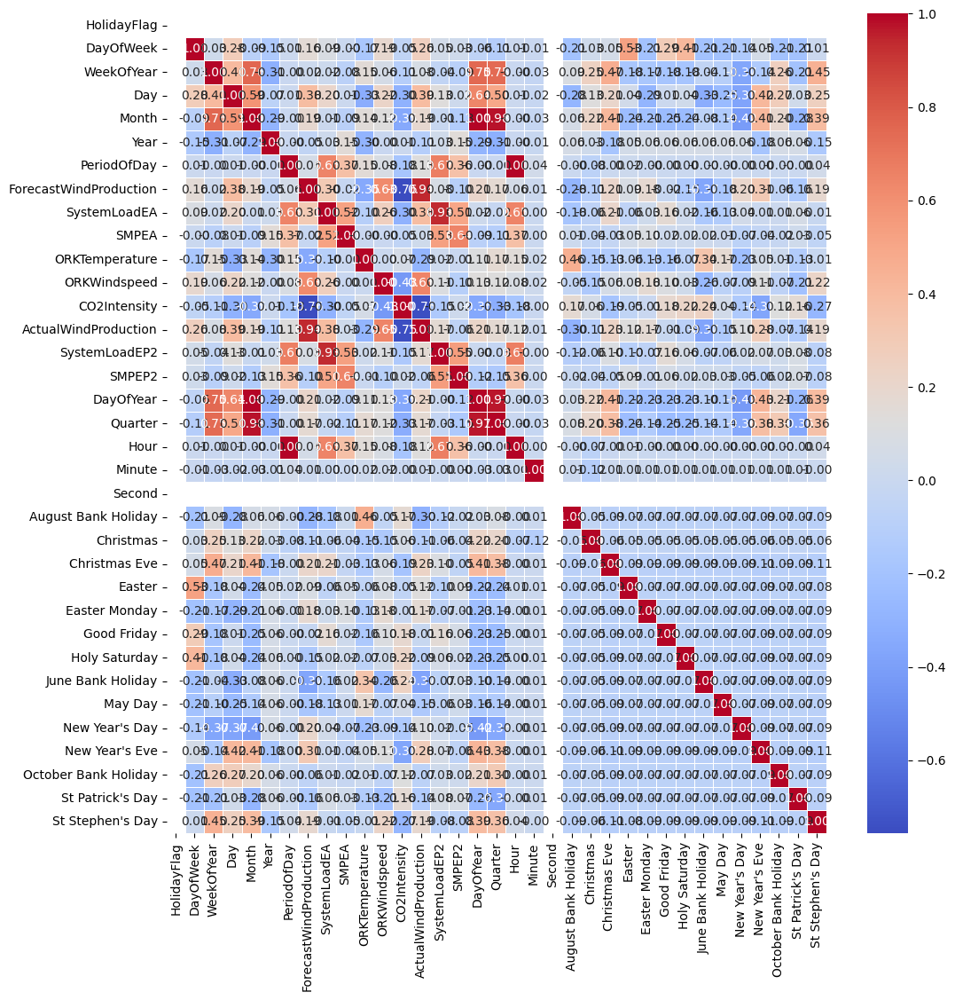

In [81]:
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(),annot=True,linewidths=0.7,fmt=".2f",cmap="coolwarm")
plt.show()


In [82]:
cor=df.corr()["SMPEP2"].sort_values(ascending=False)
pd.DataFrame({"column":cor.index,"Correlation with a":cor.values})


,column,Correlation with a
0,SMPEP2,1.000000
1,SMPEA,0.643880
2,SystemLoadEP2,0.545515
3,SystemLoadEA,0.505297
4,Hour,0.360099
5,PeriodOfDay,0.359832
6,Year,0.147765
7,Easter,0.085688
8,St Patrick's Day,0.073638
9,Good Friday,0.064262


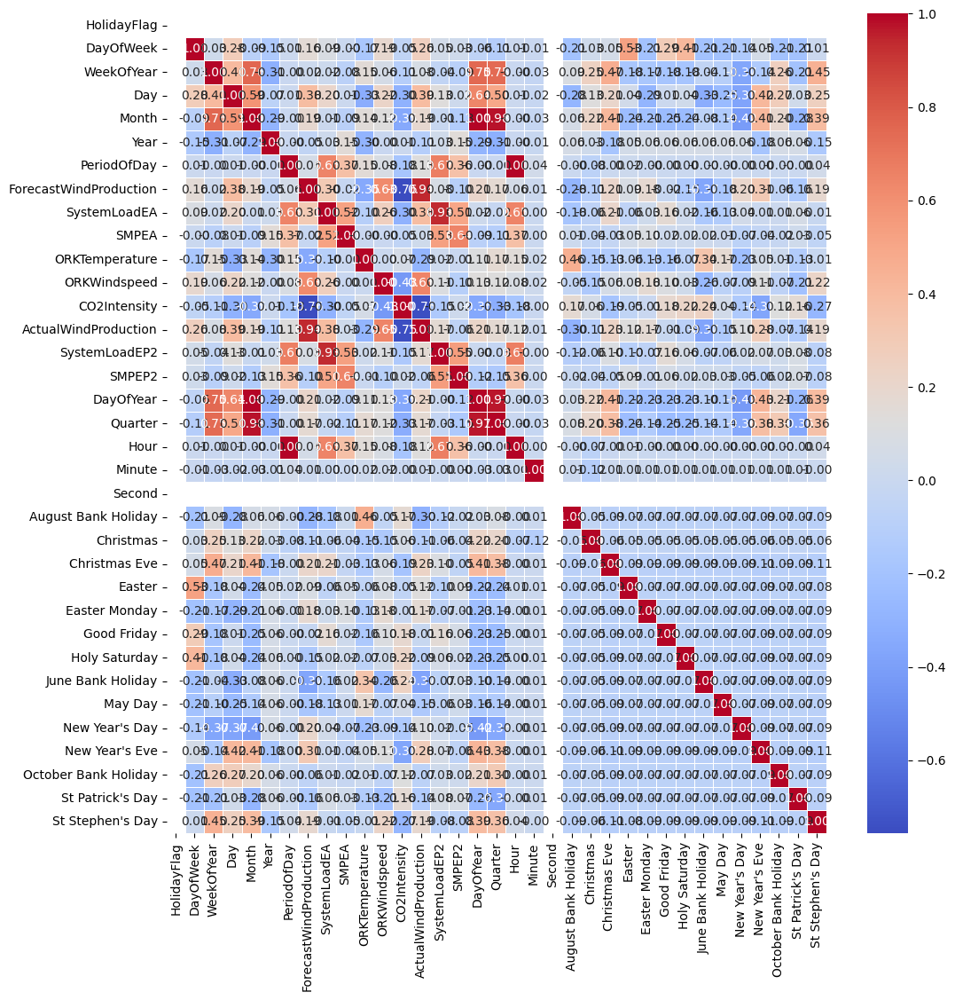

,SMPEA
SMPEA,1.000000
SMPEP2,0.643880
SystemLoadEP2,0.528273
SystemLoadEA,0.524638
Hour,0.366005
PeriodOfDay,0.365764
Year,0.151110
Easter Monday,0.100321
Easter,0.052511
ActualWindProduction,0.027358


In [83]:
 # there is not a very high correlation between correlations

import matplotlib.pyplot as plt
# Correlation Matrix Heatmap
plt.figure(figsize=(12, 12))
sns.heatmap(df.corr(numeric_only=True), annot=True, linewidths=.7, fmt=".2f", cmap="coolwarm")
plt.show()

# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only=True)

# Find the correlation between 'SMPEA' and other features
smpea_correlations = correlation_matrix['SMPEA'].sort_values(ascending=False)

smpea_correlations


In [84]:
#Modelling¶
X=df.drop("SMPEP2",axis=1)
y=df["SMPEP2"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [85]:
ridge=Ridge().fit(X_train,y_train)
lasso=Lasso().fit(X_train,y_train)
enet=ElasticNet().fit(X_train,y_train)
knn=KNeighborsRegressor().fit(X_train,y_train)
ada=AdaBoostRegressor().fit(X_train,y_train)


In [86]:
!pip install xgboost lightgbm catboost



  Using cached catboost-1.2.7-cp311-cp311-manylinux2014_x86_64.whl.metadata (1.2 kB)
  Using cached graphviz-0.20.3-py3-none-any.whl.metadata (12 kB)
  Using cached matplotlib-3.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached pandas-2.2.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (89 kB)
  Using cached scipy-1.15.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached plotly-6.0.1-py3-none-any.whl.metadata (6.7 kB)
  Using cached six-1.17.0-py2.py3-none-any.whl.metadata (1.7 kB)
  Using cached python_dateutil-2.9.0.post0-py2.py3-none-any.whl.metadata (8.4 kB)
  Using cached pytz-2025.2-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2025.2-py2.py3-none-any.whl.metadata (1.4 kB)
  Using cached contourpy-1.3.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.

In [89]:
import xgboost as xgb
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
svm=SVR().fit(X_train,y_train)
mlpc=MLPRegressor().fit(X_train,y_train)
dtc=DecisionTreeRegressor().fit(X_train,y_train)
rf=RandomForestRegressor().fit(X_train,y_train)
# Import XGBRegressor
from xgboost import XGBRegressor
xgb=XGBRegressor().fit(X_train,y_train)
gbm=GradientBoostingRegressor().fit(X_train,y_train)
lgb=LGBMRegressor().fit(X_train,y_train)
catbost=CatBoostRegressor().fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1766
[LightGBM] [Info] Number of data points in the train set: 1132, number of used features: 32
[LightGBM] [Info] Start training from score 63.191908
Learning rate set to 0.041753
0:	learn: 33.7863106	total: 51.7ms	remaining: 51.7s
1:	learn: 33.1873739	total: 53.7ms	remaining: 26.8s
2:	learn: 32.6129488	total: 55.6ms	remaining: 18.5s
3:	learn: 32.0568034	total: 57.5ms	remaining: 14.3s
4:	learn: 31.4744302	total: 61.6ms	remaining: 12.3s
5:	learn: 30.9886986	total: 64.5ms	remaining: 10.7s
6:	learn: 30.5257558	total: 66.4ms	remaining: 9.42s
7:	learn: 30.1157092	total: 68.3ms	remaining: 8.47s
8:	learn: 29.6361020	total: 70.2ms	remaining: 7.72s
9:	learn: 29.184

In [90]:
models=[ridge,lasso,dtc,rf,xgb,gbm,lgb,catbost,enet,knn,ada,mlpc,svm]


In [91]:
def ML(y,models):
    accuary=models.score(X_train,y_train)
    return accuary


In [92]:
for i in models:
     print(i,"Algorithm succed rate :",ML("SMPEP2",i))


Ridge() Algorithm succed rate : 0.5348816637170691
Lasso() Algorithm succed rate : 0.5181330828932802
DecisionTreeRegressor() Algorithm succed rate : 1.0
RandomForestRegressor() Algorithm succed rate : 0.9537038306291419


Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7e80d2387ba0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1187, in _make_controller_from_path
    lib_controller = controller_class(
                     ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/ctypes/__init__.py", line 376, in __init__
    self._handle = _dlopen(self._name, mode)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^
OSError: dlopen() error


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...) Algorithm succed rate : 0.9996515967764132
GradientBoostingRegressor() Algorithm succed rate : 0.9046060764187365
LGBMRegressor() Algorithm succed rate : 0.9290649312825421
<catboost.core.CatBoostRegressor object at 0x7e8110869090> Algorithm succed rate

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7e80d2387ba0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 1187, in _make_controller_from_path
    lib_controller = controller_class(
                     ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/ctypes/__init__.py", line 376, in __init__
    self._handle = _dlopen(self._name, mode)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^
OSError: dlopen() error


KNeighborsRegressor() Algorithm succed rate : 0.7830666048133326
AdaBoostRegressor() Algorithm succed rate : 0.6117499584503066
MLPRegressor() Algorithm succed rate : 0.5854186548813081
SVR() Algorithm succed rate : 0.18819533497961738


In [93]:
cor=df.corr()["SMPEP2"].sort_values(ascending=False)
pd.DataFrame({"column":cor.index,"Correlation with a":cor.values})


,column,Correlation with a
0,SMPEP2,1.000000
1,SMPEA,0.643880
2,SystemLoadEP2,0.545515
3,SystemLoadEA,0.505297
4,Hour,0.360099
5,PeriodOfDay,0.359832
6,Year,0.147765
7,Easter,0.085688
8,St Patrick's Day,0.073638
9,Good Friday,0.064262


In [99]:
# let's reduce the number of variables and observe
X2=df[["SMPEA","SystemLoadEP2","SystemLoadEA","PeriodOfDay",
     "Year","ActualWindProduction"]] # Changed "year" to "Year"
y2=df["SMPEP2"]
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)
rf2=RandomForestRegressor().fit(X2_train,y2_train)
print(rf2.score(X2_train,y2_train))
print(rf2.score(X2_test,y2_test))

0.9494980390318051
0.6960066418252957


In [101]:
X3=df_remove_out.drop("SMPEP2",axis=1)
y3=df_remove_out["SMPEP2"]
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=42)
rf3=RandomForestRegressor().fit(X3_train,y3_train)
print(rf3.score(X3_train,y3_train))
print(rf3.score(X3_test,y3_test))

0.9558850994883762
0.6741483085277218


In [103]:
X3=df_remove_out.drop("SMPEP2",axis=1)
y3=df_remove_out["SMPEP2"]
# Perform the train-test split for X3 and y3
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=42)
dtc3=DecisionTreeRegressor().fit(X3_train,y3_train)
print(dtc3.score(X3_train,y3_train))
print(dtc3.score(X3_test,y3_test))

1.0
0.48798151474855767


In [104]:
!pip install hyperopt
from hyperopt import tpe,STATUS_OK,Trials,fmin,hp
from hyperopt.pyll.base import scope

In [105]:
space={
    "max_depth":hp.randint("max_depth",2,15),
    "min_samples_split":hp.randint("min_samples_split",2,20),
    "min_samples_leaf":hp.randint("min_samples_leaf",1,20),
    "n_estimators":hp.randint("n_estimators",50,1000)

}

In [106]:
def hyperparameter_tuning(params):
    clf=RandomForestRegressor(**params).fit(X_train,y_train)
    acc=rf.score(X_train,y_train)
    return acc

In [107]:
trials=Trials()

best=fmin(fn=hyperparameter_tuning,
         space=space,
         algo=tpe.suggest,max_evals=100,trials=trials
         )
print("best:{}".format(best))

100%|██████████| 100/100 [05:50<00:00,  3.51s/trial, best loss: 0.9537038306291419]
best:{'max_depth': 10, 'min_samples_leaf': 6, 'min_samples_split': 18, 'n_estimators': 751}


In [108]:
best

{'max_depth': 10,
 'min_samples_leaf': 6,
 'min_samples_split': 18,
 'n_estimators': 751}